# Loading Modules

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
from LogGabor import LogGabor
from what_where.main import init, MNIST
from what_where.where import RetinaFill, WhereShift, RetinaBackground, RetinaMask
from POLO.PYramid2 import cropped_pyramid, local_filter, get_K, log_gabor_transform
from POLO.PYramid2 import inverse_pyramid, get_K_inv, inverse_gabor
from utils import view_data
from typing import List, Tuple

Default lg shape= 32 32


In [2]:
#args.offset_std = 30
#args.contrast = 0.7

width = {'in': 32, 'out': 64}

n_levels = {'in': 3, 'out': 3} 

base_levels = 2

n_color = {'in': 3, 'out': 3}

color = True

color_mode= 'rgb' #'lab' # 'hsv' #True

r_min = {'in': width['in'] / 4, 'out': width['out'] / 4}

r_max = {'in': width['in'] / 2, 'out': width['out'] / 2}

n_sublevel = n_eccentricity = {'in': 2, 'out': 4}

n_azimuth = {'in': 16, 'out': 32}

n_theta = {'in': 8, 'out': 8}

n_phase = {'in': 1, 'out': 1}

do_mask = False

gauss = False






In [3]:
lg={}
for k in ['in', 'out']:
    pe = {'N_X': width[k], 'N_Y': width[k], 'do_mask': do_mask, 'base_levels':
              base_levels, 'n_theta': 0, 'B_sf': np.inf, 'B_theta': np.inf ,
          'use_cache': True, 'figpath': 'results', 'edgefigpath':
              'results/edges', 'matpath': 'cache_dir', 'edgematpath':
              'cache_dir/edges', 'datapath': 'database/', 'ext': '.pdf', 'figsize':
              14.0, 'formats': ['pdf', 'png', 'jpg'], 'dpi': 450, 'verbose': 0}   

    lg[k] = LogGabor(pe)

In [4]:
K = {}
for k in ['in', 'out']:
    K[k] = get_K(width=width[k],
          n_sublevel = n_sublevel[k], 
          n_azimuth = n_azimuth[k], 
          n_theta = n_theta[k],
          n_phase = n_phase[k], 
          r_min = r_min[k], 
          r_max = r_max[k], 
          log_density_ratio = 2, 
          verbose=True,
          lg=lg[k])

i_sublevel, sf_0, radius 0 0.36067376022224085 8.0
i_sublevel, sf_0, radius 1 0.25503486164919736 11.31370849898476
K shape= torch.Size([32, 32, 2, 16, 8, 1])
K min max= tensor(-0.3125) tensor(1.)
i_sublevel, sf_0, radius 0 0.18033688011112042 16.0
i_sublevel, sf_0, radius 1 0.15164463602348005 19.027313840043536
i_sublevel, sf_0, radius 2 0.12751743082459868 22.62741699796952
i_sublevel, sf_0, radius 3 0.10722895046276856 26.908685288118864
K shape= torch.Size([64, 64, 4, 32, 8, 1])
K min max= tensor(-0.2759) tensor(1.)


In [5]:
K_inv={}
for k in ['in', 'out']:
    K_inv[k] = get_K_inv(K[k], 
                  width=width[k], 
                  n_sublevel = n_sublevel[k], 
                  n_azimuth = n_azimuth[k], 
                  n_theta = n_theta[k], 
                  n_phase = n_phase[k])

Filter tensor shape= torch.Size([32, 32, 2, 16, 8, 1])
Reshaped filter tensor= torch.Size([1024, 256])
Tensor shape= torch.Size([256, 1024])
Filter tensor shape= torch.Size([64, 64, 4, 32, 8, 1])
Reshaped filter tensor= torch.Size([4096, 1024])
Tensor shape= torch.Size([1024, 4096])


# Loading the Data

- Loading the data with the parameters given in the .json file for the What/Where model

In [6]:
args = init(filename='2020-07-01')
args

{'w': 28,
 'minibatch_size': 100,
 'train_batch_size': 50000,
 'test_batch_size': 10000,
 'noise_batch_size': 1000,
 'mean': 0.1307,
 'std': 0.3081,
 'what_offset_std': 15,
 'what_offset_max': 25,
 'N_pic': 128,
 'offset_std': 30,
 'offset_max': 34,
 'noise': 0.75,
 'contrast': 0.7,
 'sf_0': 0.1,
 'B_sf': 0.1,
 'do_mask': True,
 'N_theta': 6,
 'N_azimuth': 24,
 'N_eccentricity': 10,
 'N_phase': 2,
 'rho': 1.41,
 'bias_deconv': True,
 'p_dropout': 0.0,
 'dim1': 1000,
 'dim2': 1000,
 'lr': 0.005,
 'do_adam': True,
 'bn1_bn_momentum': 0.5,
 'bn2_bn_momentum': 0.5,
 'momentum': 0.3,
 'epochs': 60,
 'num_processes': 1,
 'no_cuda': False,
 'log_interval': 100,
 'verbose': 1,
 'filename': '../data/2020-07-01',
 'seed': 2019,
 'N_cv': 10,
 'do_compute': True,
 'save_model': True}

In [7]:
class DualCroppedPyramid(object):
    def __init__(self, width, 
                 base_levels, 
                 color=color, 
                 do_mask=do_mask, 
                 verbose=False, 
                 n_levels=None, 
                 color_mode='rgb'):
        self.width = width
        self.base_levels = base_levels
        self.color = color
        self.do_mask = do_mask
        self.verbose = verbose
        self.n_levels = n_levels
        self.color_mode = color_mode

    def __call__(self, img):
        img_crop = {}
        for k in ['in', 'out']:
            img_crop_part, level_size = cropped_pyramid(img.unsqueeze(0), 
                                               width=self.width[k], 
                                               base_levels=self.base_levels,
                                               color=self.color, 
                                               do_mask=self.do_mask, 
                                               verbose=self.verbose,
                                               squeeze=True,
                                               gauss=gauss,
                                               n_levels=self.n_levels[k],
                                               color_mode=self.color_mode)
            #print(img_crop_part.shape)
            img_crop[k] = img_crop_part[:self.n_levels[k]-1,...]
        return img, img_crop   

### LogGaborTransform

In [8]:
class DualLogGaborTransform(object):
    def __init__(self, K=K, color=color, verbose=False):
        self.K = K
        self.color = color
        self.verbose = verbose

    def __call__(self, cropped_pyr):
        img = cropped_pyr[0]
        img_crop = cropped_pyr[1]
        log_gabor_coeffs = {}
        for k in ['in', 'out']:
            log_gabor_coeffs[k] = log_gabor_transform(img_crop[k].unsqueeze(1), K[k], color=self.color).squeeze(1)
        
        return img, log_gabor_coeffs

In [9]:
class DualLogGaborReshape(object):
    def __init__(self, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color, verbose=False):
        self.n_levels = n_levels
        self.n_color = n_color
        self.n_eccentricity = n_eccentricity 
        self.n_azimuth = n_azimuth 
        self.n_theta = n_theta
        self.n_phase = n_phase  
        self.color = color
        self.verbose = verbose

    def __call__(self, log_gabor_transform):
        img = log_gabor_transform[0]
        log_gabor_coeffs = log_gabor_transform[1]
        for k in ['in', 'out']:
            # n_batch, n_levels, n_color, n_sublevel, n_azimuth, n_theta, n_phase
            # x      , 0       , 1      , 2         , 3        , 4      , 5
            # 
            #print(log_gabor_coeffs[k].shape)
            log_gabor_coeffs[k] = log_gabor_coeffs[k].permute(1, 4, 5, 0, 2, 3).contiguous()
            log_gabor_coeffs[k] = log_gabor_coeffs[k].view(self.n_color[k]*self.n_theta[k]*self.n_phase[k], 
                                                     (self.n_levels[k]-1) * self.n_eccentricity[k], 
                                                     self.n_azimuth[k])
 
        return img, log_gabor_coeffs

In [323]:
class LogGaborInvReshape(object):
    def __init__(self, n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color, verbose=False):
        self.n_levels = n_levels
        self.n_color = n_color
        self.n_eccentricity = n_eccentricity 
        self.n_azimuth = n_azimuth 
        self.n_theta = n_theta
        self.n_phase = n_phase  
        self.color = color
        self.verbose = verbose
    
    def __call__(self, log_gabor_coeffs):

        if self.verbose:
            print('log_gabor_coeffs.shape:', log_gabor_coeffs.shape)
        log_gabor_coeffs = log_gabor_coeffs.view(-1, 
                                                 self.n_color, 
                                                 self.n_theta, 
                                                 self.n_phase, 
                                                 self.n_levels-1, 
                                                 self.n_eccentricity, 
                                                 self.n_azimuth)
        log_gabor_coeffs = log_gabor_coeffs.permute(0, 4, 1, 5, 6, 2, 3).contiguous()
        return log_gabor_coeffs

In [352]:
class LogGaborInvTransform(object):
    def __init__(self, K_inv=K_inv, color=color, verbose=False):
        self.K_inv = K_inv
        self.color = color
        self.verbose = verbose
    
    def __call__(self, log_gabor_coeffs):
        log_gabor_coeffs = torch.cat((log_gabor_coeffs,torch.zeros_like(log_gabor_coeffs[:,:1,...])), dim=1) 
        img_crop=inverse_gabor(log_gabor_coeffs.detach(), self.K_inv, self.verbose)
        if self.verbose:
            print('img_crop.shape:', img_crop.shape)

        return img_crop

In [353]:
class InvCroppedPyramid(object):
    def __init__(self, 
                 #width, 
                 base_levels, 
                 color=color, 
                 #do_mask=do_mask, 
                 verbose=False, 
                 n_levels=None, 
                 color_mode='rgb',
                 N_X = 128,
                 N_Y = 128):
        #self.width = width
        self.base_levels = base_levels
        self.color = color
        #self.do_mask = do_mask
        self.verbose = verbose
        self.n_levels = n_levels
        self.color_mode = color_mode
        self.N_X = N_X
        self.N_Y = N_Y

    def __call__(self, img_crop):
        #print('img_crop.shape:', img_crop.shape)
        full_img_rec = inverse_pyramid(img_crop, 
                                       N_X = self.N_X,
                                       N_Y = self.N_Y,
                                       #width=self.width, 
                                       base_levels=self.base_levels,
                                       color=self.color, 
                                       #do_mask=self.do_mask, 
                                       verbose=self.verbose,
                                       #squeeze=True,
                                       gauss=gauss,
                                       n_levels=self.n_levels) #,
                                       #color_mode=self.color_mode)
        return full_img_rec

### Inverse transformations (for display only)

# Exploring the MNIST with where noise parameters and log polar encoding

- 128x128 pixel with shift, noise and circular mask

In [334]:
#args.offset_max = 40 #like in the paper

In [335]:
# normalization used to train VGG
# see https://pytorch.org/hub/pytorch_vision_vgg/
v_mean = np.array([0.485, 0.456, 0.406])
v_std = np.array([0.229, 0.224, 0.225])
transforms_norm = transforms.Normalize(mean=v_mean, std=v_std) # to normalize colors on the imagenet dataset



In [336]:
image_size = 256

transform_big =  transforms.Compose([
            transforms.Resize((int(image_size), int(image_size))),
            #transforms.AutoAugment(), # https://pytorch.org/vision/master/transforms.html#torchvision.transforms.AutoAugment
            transforms.ToTensor(),      # Convert the image to pyTorch Tensor data type.
            #transforms_norm, 
            DualCroppedPyramid(width=width, 
                  base_levels=base_levels,
                  color=color,
                  n_levels=n_levels),
            DualLogGaborTransform(K=K, color=color),
            DualLogGaborReshape(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color),
        ])

In [16]:
width,base_levels, color, n_levels

({'in': 32, 'out': 64}, 2, True, {'in': 3, 'out': 3})

In [17]:
image_path = "../data/animal/"

image_dataset = { 'train' : datasets.ImageFolder(
                            image_path+'train', 
                            transform=transform_big
                        ),
                  'test' : datasets.ImageFolder(
                            image_path+'test', 
                            transform=transform_big
                        )
                }

In [18]:
dataset_size = {'train' : len(image_dataset['train']),
                'test' : len(image_dataset['test'])}

dataset_size['train'], dataset_size['test']

(2000, 1200)

In [19]:
batch_size = 50
num_workers = 1

dataloader = { 'train' : torch.utils.data.DataLoader(
                            image_dataset['train'], batch_size=batch_size,
                            shuffle=True, 
                            num_workers=num_workers,
                        ),
               'test' : torch.utils.data.DataLoader(
                            image_dataset['test'], batch_size=batch_size,
                            shuffle=True, 
                            num_workers=num_workers,
                        )
             }

In [20]:
data, label = next(iter(dataloader['train']))

In [21]:
data_original = data[0]
data_polo = data[1]
data_original.shape, data_polo['in'].shape, data_polo['out'].shape

(torch.Size([50, 3, 256, 256]),
 torch.Size([50, 24, 4, 16]),
 torch.Size([50, 24, 8, 32]))

In [22]:
# n_batch, n_levels, n_color, n_sublevel, n_azimuth, n_theta, n_phase

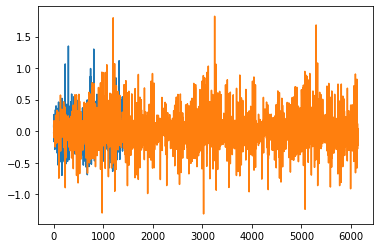

In [23]:
plt.plot(data_polo['in'][3,...].detach().numpy().flatten())
plt.plot(data_polo['out'][3,...].detach().numpy().flatten())


### Displaying Log Gabor Encoded visual field using pseudo-inverse transformation

In [354]:
inverse_transform = {}
for k in ['in', 'out']:
    N_X = N_Y = width[k] * 2**(n_levels[k]-1)
    print(N_X)
    inverse_transform[k] = transforms.Compose([
        LogGaborInvReshape(n_levels[k], n_color[k], n_eccentricity[k], n_azimuth[k], n_theta[k], n_phase[k], color=color, verbose=False),        
        LogGaborInvTransform(K_inv=K_inv[k], color=color, verbose=False),
        InvCroppedPyramid(base_levels, n_levels=n_levels[k], verbose=False, N_X=N_X, N_Y=N_Y),
    ])

128
256


- The Log-Polar compressed format

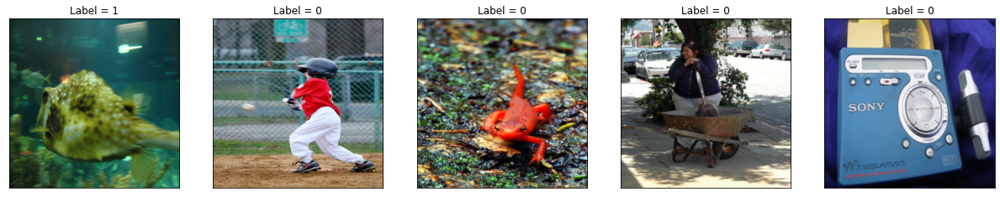

In [329]:
original = view_data(data_original, label, 5)

In [330]:
inverse_transform['in']

Compose(
)

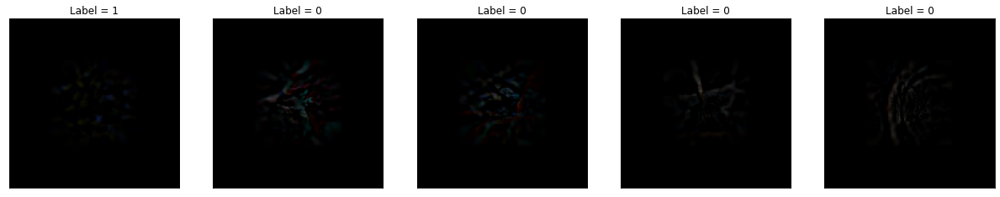

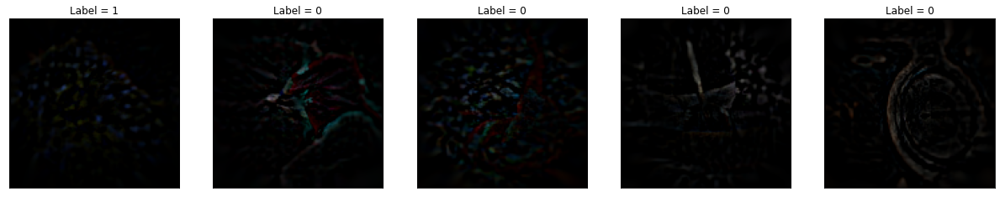

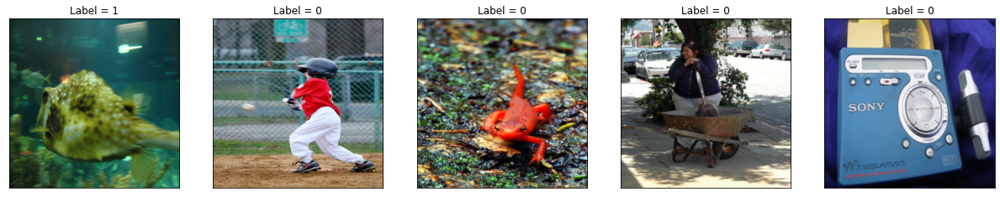

In [357]:
b = {'in':32,'out':64}
for k in ['in', 'out']:
    data = data_polo[k] #torch.cat((data_polo[k],torch.zeros_like(data_polo[k][:,:1,...])), dim=1) 
    full_img_rec = inverse_transform[k](data)
    img_aff = full_img_rec[:,:,b[k]:-b[k],b[k]:-b[k]]    
    if k == 'in':
        img_sum = full_img_rec
    else:
        img_sum += img_aff
    _ = view_data(img_sum, label, 5)
_ = view_data(data_original, label, 5)

In [322]:
76800 / (3 * 8 * 2 * 2 * 16)

50.0

- The original format

In [321]:
data_polo['in'].shape, data_polo['out'].shape

(torch.Size([50, 24, 4, 16]), torch.Size([50, 24, 8, 32]))

# Creating an Attention Transformer model with log-polar entry (POLO-STN)

In [28]:
transform_in =  transforms.Compose([
            DualCroppedPyramid(width=width, 
                  base_levels=base_levels,
                  color=color,
                  n_levels=n_levels),
            DualLogGaborTransform(K=K, color=color),
            DualLogGaborReshape(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color),
        ])

In [138]:
def kl_divergence(model, z, mu, std):
    # --------------------------
    # Monte carlo KL divergence
    # --------------------------
    # 1. define the first two probabilities (in this case Normal for both)
    p = torch.distributions.Normal(torch.zeros_like(mu), .3 * torch.ones_like(std))

    # 2. get the probabilities from the equation
    log_qzx = model.q.log_prob(z)
    log_pz = p.log_prob(z)

    # kl
    kl = (log_qzx - log_pz)
    
    # sum over last dim to go from single dim distribution to multi-dim
    kl = kl.sum()
    return kl

In [139]:
class Polo_AttentionTransNet(nn.Module):
    
    def __init__(self, do_stn=True):
        super(Polo_AttentionTransNet, self).__init__()
        
        self.do_stn = do_stn

        ##  The what pathway
        #self.wloc1 = nn.Conv2d(n_color['out'] * n_theta['out'] * n_phase['out'], 
        #                      50, 3, padding=1)
        #self.wloc2a = nn.Conv2d(50, 100, 3, padding=1)
        #self.wloc2b = nn.Conv2d(n_color['in'] * n_theta['in'] * n_phase['in'], 
        #                       50, 3, padding=1)
        self.wloc3 = nn.Linear((n_levels['in']-1) * n_eccentricity['in'] // 2 * n_azimuth['in'] // 2 * (50+100), 
                              500)
        self.wloc4 = nn.Linear(500, 2)

        #self.wloc4.weight.data.zero_()
        #self.wloc4.bias.data.zero_()

                
        ##  The where pathway        
        self.loc1 = nn.Conv2d(n_color['out'] * n_theta['out'] * n_phase['out'], 
                              50, 5, padding=2)
        self.loc2a = nn.Conv2d(50, 100, 5, padding=2)
        self.loc2b = nn.Conv2d(n_color['in'] * n_theta['in'] * n_phase['in'], 
                               50, 5, padding=2)
        self.loc3 = nn.Linear((n_levels['in']-1) * n_eccentricity['in'] // 2 * n_azimuth['in'] // 2 * (50+100), 
                              500)
        self.mu = nn.Linear(500, 2) #, bias=False)
        self.logvar = nn.Linear(500, 2) #, bias=False)
        
        

        #self.loc4.weight.data.zero_()
        #self.loc4.bias.data.zero_()

        self.downscale = nn.Parameter(torch.tensor([[1, 0], [0, 1]],
                                                   dtype=torch.float),
                                      requires_grad=False)

    def stn(self: object, x: torch.Tensor, x_polo: torch.Tensor) -> Tuple[torch.Tensor]:
    
        if self.do_stn:
            xs_part = {}
            #for k in ['in', 'out']:
            #    print(x_polo[k].shape)
            #    xs_part[k] = x_polo[k].permute(0,2,5,6,1,3,4)
            #    xs_part[k] = xs_part[k].view(-1, n_color[k] * n_theta[k] * n_phase[k], 
            #                                 (n_levels[k]-1) * n_eccentricity[k], 
            #                                 n_azimuth[k])

            #print(x_polo['out'].shape)

            with torch.no_grad():
                xs = F.relu(self.loc1(x_polo['out']))
                xs = nn.MaxPool2d(2)(xs)        

                #print(xs.shape)

                xsa = F.relu(self.loc2a(xs))
                xsa = nn.MaxPool2d(2)(xsa)

                #print(xsa.shape)

                xsb = F.relu(self.loc2b(x_polo['in']))
                xsb = nn.MaxPool2d(2)(xsb)

                #print(xsb.shape)

                xs = torch.cat((xsa, xsb), dim=1)
            xs = F.relu(self.loc3(xs.view(-1, 
                                          (50+100) * (n_levels['in']-1) * n_eccentricity['in'] // 2 * n_azimuth['in'] // 2)))
            #theta = F.sigmoid(self.loc4(xs)) - 0.5
            #theta = self.loc4(xs)
            mu = self.mu(xs)
            logvar = self.logvar(xs) + 3
            sigma = torch.exp(-logvar / 2)
            self.q = torch.distributions.Normal(mu, sigma)
            z = self.q.rsample()
            print(z[0,...])
            theta = torch.cat((self.downscale.unsqueeze(0).repeat(
                                z.size(0), 1, 1), z.unsqueeze(2)),
                                  dim=2)
        
            grid_size = torch.Size([x.size()[0], x.size()[1], 256, 256])
            grid = F.affine_grid(theta, grid_size)
            x = F.grid_sample(x, grid)

        else:
            theta = nn.Parameter(torch.tensor([[1, 0, 0], [0, 1, 0]],
                                                   dtype=torch.float),
                                      requires_grad=False)
            theta = theta.unsqueeze(0).repeat(x.size()[0], 1, 1)
            z = torch.tensor([0, 0],dtype=torch.float)
            z = z.unsqueeze(0).repeat(x.size()[0], 1)
            mu = torch.tensor([0, 0],dtype=torch.float)
            mu = mu.unsqueeze(0).repeat(x.size()[0], 1)   
            sigma = torch.tensor([1, 1],dtype=torch.float)
            sigma = sigma.unsqueeze(0).repeat(x.size()[0], 1)      
        return x, theta, z, mu, sigma

    def forward(self, x, x_polo):
        # transform the input
        x, theta, z, mu, sigma = self.stn(x, x_polo)
        
        if self.do_stn:
        
            w_x_polo ={'in': torch.zeros_like(x_polo['in']),
                       'out': torch.zeros_like(x_polo['out'])}
            for i in range(batch_size):
                d, w = transform_in(x[i,...])
                w_x_polo['in'][i,...] = w['in']
                w_x_polo['out'][i,...] = w['out']
        else:
            w_x_polo = x_polo
                                           

        # print(x.shape)
        # Perform the usual forward pass
        ya = F.relu(self.loc1(w_x_polo['out']))
        ya = nn.MaxPool2d(2)(ya)        
        
        #print(xs.shape)
        
        ya = F.relu(self.loc2a(ya))
        ya = nn.MaxPool2d(2)(ya)
        
        #print(xsa.shape)
        
        yb = F.relu(self.loc2b(w_x_polo['in']))
        yb = nn.MaxPool2d(2)(yb)
        
        #print(xsb.shape)

        y = torch.cat((ya, yb), dim=1)
        y = F.relu(self.wloc3(y.view(-1, (50+100) * (n_levels['in']-1) * n_eccentricity['in'] // 2 * n_azimuth['in'] // 2)))
        y = self.wloc4(y)
        return y, theta, z, mu, sigma

In [140]:
def train(epoch, loader):
    model.train()
    for batch_idx, (data, target) in enumerate(loader):

        data_original, data_polo = data[0], data[1]
        data_original, data_polo['in'], data_polo['out'], target = data_original.to(
            device, dtype=torch.double), data_polo['in'].to(
                device, dtype=torch.double), data_polo['out'].to(
                device, dtype=torch.double), target.to(device)

        optimizer.zero_grad()
        output, theta, z, mu, sigma = model(data_original, data_polo)
        if model.do_stn :
            loss = loss_func(output, target) + kl_divergence(model, z, mu, sigma)
        else:
            loss = loss_func(output, target)
        loss.backward()
        optimizer.step()
        if batch_idx % args.log_interval == 0:
            print('Train Epoch: {}/{} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, args.epochs, batch_idx * len(data_original),
                len(dataloader['train'].dataset),
                100. * batch_idx / len(dataloader['train']), loss.item()))


def test(loader):
    with torch.no_grad():
        model.eval()
        test_loss = 0
        correct = 0
        for data, target in loader:
            data_original, data_polo = data[0], data[1]
            data_original = data_original.to(device, dtype=torch.double)            
            data_polo['in'] = data_polo['in'].to(device, dtype=torch.double) 
            data_polo['out'] = data_polo['out'].to(device, dtype=torch.double) 
            target = target.to(device)

            output, theta, z, mu, sigma = model(data_original, data_polo)

            # sum up batch loss
            #test_loss += F.nll_loss(output, target, size_average=False).item()
            test_loss += loss_func(output, target).item()
            # get the index of the max log-probability
            #pred = output.max(1, keepdim=True)[1]
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

        test_loss /= len(dataloader['test'].dataset)
        print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.
              format(test_loss, correct, len(dataloader['test'].dataset),
                     100. * correct / len(dataloader['test'].dataset)))
        return correct / len(dataloader['test'].dataset)

# Training 

In [141]:
lr = 1e-4

In [142]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#model = torch.load("../models/low_comp_polo_stn.pt")
model = Polo_AttentionTransNet().to(device)

In [143]:
optimizer = optim.Adam(model.parameters(), lr=lr)
#optimizer = optim.SGD(model.parameters(), lr=lr)
loss_func = nn.CrossEntropyLoss()
#scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.9, last_epoch=-1) #, verbose=True)

In [144]:
acc = []

In [145]:
args.epochs = 100
model.do_stn = True
for epoch in range(1, args.epochs + 1):
    train(epoch, dataloader['train'])
    curr_acc = test(dataloader['test'])
    acc.append(curr_acc)
    #scheduler.step()

tensor([ 0.1516, -0.0858], grad_fn=<SelectBackward0>)
Train Epoch: 1/100 [0/2000 (0%)]	Loss: 16.398374
tensor([ 0.0933, -0.2695], grad_fn=<SelectBackward0>)
tensor([-0.0399,  0.2165], grad_fn=<SelectBackward0>)
tensor([-0.1299,  0.0878], grad_fn=<SelectBackward0>)
tensor([0.1808, 0.1654], grad_fn=<SelectBackward0>)
tensor([-0.1891, -0.1490], grad_fn=<SelectBackward0>)
tensor([0.0515, 0.3944], grad_fn=<SelectBackward0>)
tensor([ 0.0475, -0.0124], grad_fn=<SelectBackward0>)
tensor([0.0879, 0.3392], grad_fn=<SelectBackward0>)
tensor([-0.2329, -0.0525], grad_fn=<SelectBackward0>)
tensor([-0.1727, -0.4595], grad_fn=<SelectBackward0>)
tensor([-0.2680,  0.0867], grad_fn=<SelectBackward0>)
tensor([-0.0810, -0.0861], grad_fn=<SelectBackward0>)
tensor([-0.0869,  0.0774], grad_fn=<SelectBackward0>)
tensor([0.2662, 0.3905], grad_fn=<SelectBackward0>)
tensor([ 0.1556, -0.0668], grad_fn=<SelectBackward0>)
tensor([-0.0336, -0.0206], grad_fn=<SelectBackward0>)
tensor([0.2862, 0.2353], grad_fn=<SelectB

tensor([-0.3845, -0.1375])
tensor([-0.2604, -0.1420])
tensor([-0.0169,  0.1554])
tensor([-0.0254, -0.4486])
tensor([-0.5416,  0.3705])
tensor([ 0.3198, -0.5591])
tensor([-0.0482, -0.0371])
tensor([-0.4182,  0.1770])
tensor([-0.0404, -0.2270])
tensor([-0.3734,  0.3357])
tensor([0.2897, 0.1464])
tensor([0.3832, 0.1932])
tensor([ 0.2263, -0.3823])
tensor([-0.1737,  0.3413])
tensor([-0.2360, -0.0569])

Test set: Average loss: 0.0137, Accuracy: 690/1200 (58%)

tensor([-0.2432, -0.2393], grad_fn=<SelectBackward0>)
Train Epoch: 4/100 [0/2000 (0%)]	Loss: 1.907213
tensor([0.0979, 0.2307], grad_fn=<SelectBackward0>)
tensor([-0.2069,  0.1388], grad_fn=<SelectBackward0>)
tensor([0.0703, 0.1347], grad_fn=<SelectBackward0>)
tensor([ 0.1205, -0.1050], grad_fn=<SelectBackward0>)
tensor([ 0.4574, -0.1513], grad_fn=<SelectBackward0>)
tensor([0.1478, 0.0420], grad_fn=<SelectBackward0>)
tensor([-0.0709,  0.0838], grad_fn=<SelectBackward0>)
tensor([-0.0465,  0.0911], grad_fn=<SelectBackward0>)
tensor([0.27

tensor([ 0.1547, -0.7428], grad_fn=<SelectBackward0>)
tensor([-0.2385,  0.0698], grad_fn=<SelectBackward0>)
tensor([-0.2711,  0.5928], grad_fn=<SelectBackward0>)
tensor([0.9127, 0.4339])
tensor([ 0.4163, -0.1194])
tensor([-0.0784, -0.2841])
tensor([0.2297, 0.1332])
tensor([-0.1702, -0.1148])
tensor([0.1702, 0.2579])
tensor([ 0.0987, -0.1236])
tensor([0.3805, 0.1353])
tensor([-0.5642,  0.0486])
tensor([0.3568, 0.0732])
tensor([-0.1739, -0.2537])
tensor([-0.1342,  0.4069])
tensor([0.1755, 0.1018])
tensor([0.3529, 0.5236])
tensor([-0.1215,  0.1509])
tensor([-0.1568, -0.2742])
tensor([ 0.1335, -0.2565])
tensor([-0.3793, -0.0051])
tensor([ 0.1631, -0.3060])
tensor([-0.5162,  0.6473])
tensor([-0.3770,  0.3262])
tensor([-0.0546, -0.5059])
tensor([0.6474, 0.1472])
tensor([0.4656, 0.1018])

Test set: Average loss: 0.0135, Accuracy: 688/1200 (57%)

tensor([-0.3320, -0.2685], grad_fn=<SelectBackward0>)
Train Epoch: 7/100 [0/2000 (0%)]	Loss: 1.565188
tensor([-0.3093,  0.2863], grad_fn=<SelectBackw

KeyboardInterrupt: 

In [193]:
args.epochs = 100
model.do_stn = True
for epoch in range(1, args.epochs + 1):
    train(epoch, dataloader['train'])
    curr_acc = test(dataloader['test'])
    acc.append(curr_acc)
    #scheduler.step()

tensor([0.1730, 0.5491], grad_fn=<SelectBackward0>)
Train Epoch: 1/100 [0/2000 (0%)]	Loss: 1.267071
tensor([ 0.3677, -0.1916], grad_fn=<SelectBackward0>)
tensor([ 0.3218, -0.3146], grad_fn=<SelectBackward0>)
tensor([-0.2311,  0.0340], grad_fn=<SelectBackward0>)
tensor([-0.1373,  0.3450], grad_fn=<SelectBackward0>)
tensor([ 0.3131, -0.2541], grad_fn=<SelectBackward0>)
tensor([-0.2582,  0.4215], grad_fn=<SelectBackward0>)
tensor([ 0.2615, -0.6434], grad_fn=<SelectBackward0>)
tensor([0.4936, 0.1458], grad_fn=<SelectBackward0>)
tensor([-0.1072, -0.0642], grad_fn=<SelectBackward0>)
tensor([-0.3496, -0.3627], grad_fn=<SelectBackward0>)
tensor([-0.3113,  0.4000], grad_fn=<SelectBackward0>)
tensor([0.1656, 0.0806], grad_fn=<SelectBackward0>)
tensor([-0.0482,  0.0058], grad_fn=<SelectBackward0>)
tensor([-0.2805, -0.2051], grad_fn=<SelectBackward0>)
tensor([0.2734, 0.2053], grad_fn=<SelectBackward0>)
tensor([-0.4098, -0.4664], grad_fn=<SelectBackward0>)
tensor([-0.2293,  0.2328], grad_fn=<Select

tensor([-0.1249, -0.1007])
tensor([-0.4654, -0.0880])
tensor([ 0.1030, -0.2453])
tensor([-0.0746, -0.0725])
tensor([0.1351, 0.2931])
tensor([-0.1341, -0.2096])
tensor([ 0.1110, -0.5435])
tensor([-0.4177,  0.0524])
tensor([-0.0615, -0.1938])
tensor([-0.0500,  0.1418])
tensor([-0.0301,  0.0392])
tensor([0.2226, 0.1700])
tensor([0.2399, 0.0473])
tensor([0.2472, 0.3008])

Test set: Average loss: 0.0128, Accuracy: 739/1200 (62%)

tensor([ 0.1207, -0.0459], grad_fn=<SelectBackward0>)
Train Epoch: 4/100 [0/2000 (0%)]	Loss: 5.309400
tensor([ 0.0284, -0.1011], grad_fn=<SelectBackward0>)
tensor([0.1387, 0.0495], grad_fn=<SelectBackward0>)
tensor([-0.2574, -0.3550], grad_fn=<SelectBackward0>)
tensor([-0.4114,  0.1712], grad_fn=<SelectBackward0>)
tensor([-0.1642,  0.1326], grad_fn=<SelectBackward0>)
tensor([-0.2493,  0.2820], grad_fn=<SelectBackward0>)
tensor([-0.3444, -0.5246], grad_fn=<SelectBackward0>)
tensor([0.0644, 0.3340], grad_fn=<SelectBackward0>)
tensor([0.0763, 0.0683], grad_fn=<SelectB

tensor([0.3511, 0.0474], grad_fn=<SelectBackward0>)
tensor([0.3616, 0.0254], grad_fn=<SelectBackward0>)
tensor([-0.3364,  0.3864], grad_fn=<SelectBackward0>)
tensor([-0.2809,  0.0999])
tensor([-0.4857,  0.1778])
tensor([-0.2318,  0.3141])
tensor([ 0.0161, -0.3877])
tensor([ 0.1301, -0.1057])
tensor([ 0.5864, -0.0189])
tensor([ 0.3903, -0.4377])
tensor([ 0.0225, -0.4648])
tensor([-0.3666,  0.0295])
tensor([-0.1070,  0.2901])
tensor([0.0432, 0.2452])
tensor([ 0.5748, -0.0454])
tensor([ 0.3157, -0.1588])
tensor([-0.1397,  0.3298])
tensor([-0.8832,  0.1075])
tensor([-0.1709, -0.1758])
tensor([-0.2378,  0.2410])
tensor([0.0619, 0.3351])
tensor([-0.2354, -0.1741])
tensor([-0.6598, -0.3294])
tensor([-0.1716,  0.3385])
tensor([-0.3167, -0.2737])
tensor([-0.0996,  0.2275])
tensor([ 0.0122, -0.0851])

Test set: Average loss: 0.0124, Accuracy: 788/1200 (66%)

tensor([-0.1870,  0.0024], grad_fn=<SelectBackward0>)
Train Epoch: 7/100 [0/2000 (0%)]	Loss: 1.628711
tensor([-0.2710,  0.2450], grad_fn=<S

tensor([0.2038, 0.2865], grad_fn=<SelectBackward0>)
tensor([0.0486, 0.5479], grad_fn=<SelectBackward0>)
tensor([0.1155, 0.1296], grad_fn=<SelectBackward0>)
tensor([0.1705, 0.0892], grad_fn=<SelectBackward0>)
tensor([-0.0731, -0.1982], grad_fn=<SelectBackward0>)
tensor([-0.1584, -0.2376], grad_fn=<SelectBackward0>)
tensor([-0.4425, -0.1345], grad_fn=<SelectBackward0>)
tensor([-1.0509, -0.2753], grad_fn=<SelectBackward0>)
tensor([-0.1693, -0.1929], grad_fn=<SelectBackward0>)
tensor([0.1619, 0.9351], grad_fn=<SelectBackward0>)
tensor([-0.4040, -0.0744], grad_fn=<SelectBackward0>)
tensor([0.4724, 0.1366])
tensor([-0.0789,  0.1072])
tensor([-0.2035,  0.3064])
tensor([0.2827, 0.0746])
tensor([-0.1162,  0.2484])
tensor([0.4839, 0.2544])
tensor([-0.4532, -0.2080])
tensor([ 0.2973, -0.3618])
tensor([-0.2438,  0.2346])
tensor([-0.3668, -0.0983])
tensor([-0.4523,  0.0828])
tensor([-0.5675, -0.0348])
tensor([0.1867, 0.4540])
tensor([-0.0924,  0.0160])
tensor([-0.6618, -0.0624])
tensor([0.0750, 0.1

tensor([0.4133, 0.0026], grad_fn=<SelectBackward0>)
tensor([0.1119, 0.0508], grad_fn=<SelectBackward0>)
tensor([-0.0389,  0.5077], grad_fn=<SelectBackward0>)
tensor([ 0.2511, -0.1891], grad_fn=<SelectBackward0>)
tensor([0.0054, 0.1422], grad_fn=<SelectBackward0>)
tensor([-0.0901,  0.2113], grad_fn=<SelectBackward0>)
tensor([ 0.0819, -0.1537], grad_fn=<SelectBackward0>)
tensor([-0.1507,  0.4354], grad_fn=<SelectBackward0>)
tensor([0.3898, 0.1397], grad_fn=<SelectBackward0>)
tensor([ 0.0342, -0.3017], grad_fn=<SelectBackward0>)
tensor([-0.0854, -0.4114], grad_fn=<SelectBackward0>)
tensor([0.4043, 0.4172], grad_fn=<SelectBackward0>)
tensor([-0.2661, -0.0130], grad_fn=<SelectBackward0>)
tensor([0.1697, 0.2250], grad_fn=<SelectBackward0>)
tensor([ 0.2863, -0.1893], grad_fn=<SelectBackward0>)
tensor([0.4965, 0.2475], grad_fn=<SelectBackward0>)
tensor([0.2204, 0.7145], grad_fn=<SelectBackward0>)
tensor([ 0.3952, -0.1005], grad_fn=<SelectBackward0>)
tensor([-0.4632,  0.7708], grad_fn=<SelectBa

tensor([-0.0288,  0.2660], grad_fn=<SelectBackward0>)
tensor([-0.0742, -0.1794], grad_fn=<SelectBackward0>)
tensor([ 0.1014, -0.1688], grad_fn=<SelectBackward0>)
tensor([ 0.1953, -0.4660], grad_fn=<SelectBackward0>)
tensor([ 0.0225, -0.1169], grad_fn=<SelectBackward0>)
tensor([ 0.0105, -0.4362], grad_fn=<SelectBackward0>)
tensor([-0.2690,  0.0518], grad_fn=<SelectBackward0>)
tensor([-0.4544, -0.0121], grad_fn=<SelectBackward0>)
tensor([0.0309, 0.3244], grad_fn=<SelectBackward0>)
tensor([ 0.0491, -0.1615], grad_fn=<SelectBackward0>)
tensor([0.3895, 0.4322], grad_fn=<SelectBackward0>)
tensor([ 0.0748, -0.3323], grad_fn=<SelectBackward0>)
tensor([-0.5193, -0.0329], grad_fn=<SelectBackward0>)
tensor([-0.0082, -0.3007], grad_fn=<SelectBackward0>)
tensor([-0.4707,  0.2704], grad_fn=<SelectBackward0>)
tensor([ 0.0742, -0.4576], grad_fn=<SelectBackward0>)
tensor([ 0.1948, -0.3109], grad_fn=<SelectBackward0>)
tensor([-0.2507,  0.2373], grad_fn=<SelectBackward0>)
tensor([-0.4816, -0.1887], grad_

tensor([-0.4929,  0.0423], grad_fn=<SelectBackward0>)
tensor([0.1654, 0.1500], grad_fn=<SelectBackward0>)
tensor([-0.2181, -0.1575], grad_fn=<SelectBackward0>)
tensor([-0.2027,  0.6000], grad_fn=<SelectBackward0>)
tensor([0.1048, 0.2915], grad_fn=<SelectBackward0>)
tensor([ 0.2202, -0.6945], grad_fn=<SelectBackward0>)
tensor([0.0216, 0.4673], grad_fn=<SelectBackward0>)
tensor([-0.2280,  0.0372], grad_fn=<SelectBackward0>)
tensor([-0.0376, -0.0862], grad_fn=<SelectBackward0>)
tensor([ 0.1187, -0.4234], grad_fn=<SelectBackward0>)
tensor([-0.4275, -0.1627], grad_fn=<SelectBackward0>)
tensor([-0.0910, -0.0234], grad_fn=<SelectBackward0>)
tensor([0.1651, 0.1363], grad_fn=<SelectBackward0>)
tensor([-0.4325, -0.0527], grad_fn=<SelectBackward0>)
tensor([-0.4667,  0.5157], grad_fn=<SelectBackward0>)
tensor([0.1029, 0.3899], grad_fn=<SelectBackward0>)
tensor([0.1461, 0.7512], grad_fn=<SelectBackward0>)
tensor([-0.2761,  0.0801], grad_fn=<SelectBackward0>)
tensor([ 0.0408, -0.1854], grad_fn=<Sele

tensor([-0.1087,  0.1116])
tensor([0.1997, 0.7661])
tensor([ 0.2654, -0.3961])

Test set: Average loss: 0.0122, Accuracy: 809/1200 (67%)

tensor([-0.6366, -0.0658], grad_fn=<SelectBackward0>)
Train Epoch: 21/100 [0/2000 (0%)]	Loss: 0.400334
tensor([ 0.1913, -0.4845], grad_fn=<SelectBackward0>)
tensor([-0.2838, -0.5307], grad_fn=<SelectBackward0>)
tensor([-0.5220,  0.1953], grad_fn=<SelectBackward0>)
tensor([-0.5889, -0.5432], grad_fn=<SelectBackward0>)
tensor([0.1924, 0.5874], grad_fn=<SelectBackward0>)
tensor([0.2270, 0.3884], grad_fn=<SelectBackward0>)
tensor([ 0.2986, -0.1260], grad_fn=<SelectBackward0>)
tensor([0.7495, 0.2058], grad_fn=<SelectBackward0>)
tensor([-0.1717,  0.0613], grad_fn=<SelectBackward0>)
tensor([ 0.0490, -0.5259], grad_fn=<SelectBackward0>)
tensor([0.0189, 0.1028], grad_fn=<SelectBackward0>)
tensor([-0.3756, -0.1515], grad_fn=<SelectBackward0>)
tensor([-0.3193, -0.2709], grad_fn=<SelectBackward0>)
tensor([-0.3677,  0.2332], grad_fn=<SelectBackward0>)
tensor([ 0.

tensor([-0.2458,  0.3175])
tensor([0.2027, 0.9382])
tensor([0.1097, 0.5807])
tensor([ 0.0479, -0.3410])
tensor([-0.0956, -0.0698])
tensor([-0.1960, -0.2526])
tensor([-0.3725,  0.1388])
tensor([0.0750, 0.0585])
tensor([-0.2090,  0.2481])
tensor([-0.4752, -0.0198])
tensor([-0.1745, -0.0410])
tensor([ 0.2824, -0.0999])
tensor([ 0.2103, -0.0557])
tensor([-0.5023, -0.2313])
tensor([0.5182, 0.1176])
tensor([ 0.0529, -0.0427])
tensor([0.0135, 0.0019])
tensor([ 0.0543, -0.2159])
tensor([-0.0340,  0.0321])
tensor([0.0419, 0.1445])

Test set: Average loss: 0.0119, Accuracy: 821/1200 (68%)

tensor([-0.2296, -0.2194], grad_fn=<SelectBackward0>)
Train Epoch: 24/100 [0/2000 (0%)]	Loss: -0.916534
tensor([-0.0354,  0.0782], grad_fn=<SelectBackward0>)
tensor([0.1568, 0.2153], grad_fn=<SelectBackward0>)
tensor([-0.1895,  0.0862], grad_fn=<SelectBackward0>)
tensor([0.1004, 0.0299], grad_fn=<SelectBackward0>)
tensor([-0.2733, -0.2121], grad_fn=<SelectBackward0>)
tensor([0.1059, 0.2498], grad_fn=<SelectBac

tensor([-0.2831, -0.1562], grad_fn=<SelectBackward0>)
tensor([-0.5003,  0.2877], grad_fn=<SelectBackward0>)
tensor([ 0.1241, -0.1723], grad_fn=<SelectBackward0>)
tensor([-0.3208,  0.4641], grad_fn=<SelectBackward0>)
tensor([0.3212, 0.2036], grad_fn=<SelectBackward0>)
tensor([-0.0919,  0.1424], grad_fn=<SelectBackward0>)
tensor([ 0.3208, -0.1335])
tensor([-0.1481, -0.1813])
tensor([0.2590, 0.0538])
tensor([-0.1705,  0.5364])
tensor([-0.1285,  0.5382])
tensor([0.2303, 0.0275])
tensor([-0.0097, -0.0422])
tensor([-0.4722,  0.2413])
tensor([0.3907, 0.2003])
tensor([ 0.1468, -0.2376])
tensor([ 0.0797, -0.5009])
tensor([-0.5782, -0.4408])
tensor([0.1173, 0.1733])
tensor([ 0.0978, -0.2300])
tensor([0.1275, 0.0495])
tensor([-0.0386,  0.3451])
tensor([-0.6803,  0.0044])
tensor([-0.1854,  0.1149])
tensor([-0.4737, -0.0064])
tensor([ 0.6226, -0.5494])
tensor([0.5482, 0.3254])
tensor([-0.2267, -0.3700])
tensor([0.0019, 0.3207])
tensor([0.4883, 0.2316])

Test set: Average loss: 0.0120, Accuracy: 831

tensor([0.2118, 0.0241], grad_fn=<SelectBackward0>)
tensor([0.2260, 0.4043], grad_fn=<SelectBackward0>)
tensor([-0.0605,  0.3480], grad_fn=<SelectBackward0>)
tensor([ 0.0867, -0.1390], grad_fn=<SelectBackward0>)
tensor([ 0.1532, -0.0980], grad_fn=<SelectBackward0>)
tensor([ 0.6275, -0.2663], grad_fn=<SelectBackward0>)
tensor([ 0.1640, -0.0213], grad_fn=<SelectBackward0>)
tensor([0.3435, 0.0729], grad_fn=<SelectBackward0>)
tensor([-0.9750, -0.0466], grad_fn=<SelectBackward0>)
tensor([0.2138, 0.2056], grad_fn=<SelectBackward0>)
tensor([-0.5107,  0.2505], grad_fn=<SelectBackward0>)
tensor([ 0.2252, -0.0305], grad_fn=<SelectBackward0>)
tensor([0.3793, 0.2703], grad_fn=<SelectBackward0>)
tensor([ 0.0142, -0.4047], grad_fn=<SelectBackward0>)
tensor([-0.1195, -0.0814])
tensor([-0.3090, -0.0659])
tensor([ 0.3807, -0.1552])
tensor([0.1304, 0.3277])
tensor([ 0.6036, -0.2825])
tensor([-0.1991,  0.0488])
tensor([0.1231, 0.2062])
tensor([-0.8963, -0.1644])
tensor([ 0.2169, -0.0516])
tensor([-0.3637

tensor([ 0.2335, -0.2173], grad_fn=<SelectBackward0>)
tensor([-0.0603,  0.6328], grad_fn=<SelectBackward0>)
tensor([-0.2341,  0.2267], grad_fn=<SelectBackward0>)
tensor([-0.3104,  0.1429], grad_fn=<SelectBackward0>)
tensor([1.0722, 0.2917], grad_fn=<SelectBackward0>)
tensor([ 0.1245, -0.2906], grad_fn=<SelectBackward0>)
tensor([-0.2086, -0.3570], grad_fn=<SelectBackward0>)
tensor([-0.1233, -0.1718], grad_fn=<SelectBackward0>)
tensor([-0.1223,  0.2342], grad_fn=<SelectBackward0>)
tensor([-0.3816, -0.1026], grad_fn=<SelectBackward0>)
tensor([-0.1667, -0.0525], grad_fn=<SelectBackward0>)
tensor([-0.1026,  0.1516], grad_fn=<SelectBackward0>)
tensor([ 0.2728, -0.2939], grad_fn=<SelectBackward0>)
tensor([0.1187, 0.3338], grad_fn=<SelectBackward0>)
tensor([-0.0991,  0.2531], grad_fn=<SelectBackward0>)
tensor([0.2488, 0.0060], grad_fn=<SelectBackward0>)
tensor([-0.1987, -0.6286], grad_fn=<SelectBackward0>)
tensor([0.0468, 0.5571], grad_fn=<SelectBackward0>)
tensor([0.2967, 0.0994], grad_fn=<Se

tensor([-0.0741, -0.2035], grad_fn=<SelectBackward0>)
tensor([ 0.3733, -0.3735], grad_fn=<SelectBackward0>)
tensor([-0.0163, -0.6319], grad_fn=<SelectBackward0>)
tensor([ 0.1960, -0.6600], grad_fn=<SelectBackward0>)
tensor([-0.5586,  0.0646], grad_fn=<SelectBackward0>)
tensor([-0.3671, -0.0447], grad_fn=<SelectBackward0>)
tensor([-0.4533, -0.4645], grad_fn=<SelectBackward0>)
tensor([-0.3543, -0.4118], grad_fn=<SelectBackward0>)
tensor([-1.1146, -0.0623], grad_fn=<SelectBackward0>)
tensor([0.5071, 0.2993], grad_fn=<SelectBackward0>)
tensor([-0.5022,  0.2110], grad_fn=<SelectBackward0>)
tensor([-0.6022, -0.1504], grad_fn=<SelectBackward0>)
tensor([-0.0193,  0.5400], grad_fn=<SelectBackward0>)
tensor([0.2260, 0.1282], grad_fn=<SelectBackward0>)
tensor([0.7558, 0.2106], grad_fn=<SelectBackward0>)
tensor([-0.0640, -0.1655], grad_fn=<SelectBackward0>)
tensor([0.3983, 0.0081], grad_fn=<SelectBackward0>)
tensor([ 0.0382, -0.2773], grad_fn=<SelectBackward0>)
tensor([-0.0808, -0.4066], grad_fn=<

tensor([0.1880, 0.0342], grad_fn=<SelectBackward0>)
tensor([0.2107, 0.4583], grad_fn=<SelectBackward0>)
tensor([0.2512, 0.1200], grad_fn=<SelectBackward0>)
tensor([0.1772, 0.0557], grad_fn=<SelectBackward0>)
tensor([-0.5313,  0.0401], grad_fn=<SelectBackward0>)
tensor([ 0.2256, -0.1965], grad_fn=<SelectBackward0>)
tensor([-0.5414, -0.3392], grad_fn=<SelectBackward0>)
tensor([ 0.1830, -0.2547], grad_fn=<SelectBackward0>)
tensor([-0.1049,  0.0828], grad_fn=<SelectBackward0>)
tensor([0.1624, 0.0989], grad_fn=<SelectBackward0>)
tensor([-0.2297,  0.0445], grad_fn=<SelectBackward0>)
tensor([ 0.0795, -0.0487], grad_fn=<SelectBackward0>)
tensor([ 0.1264, -0.0900], grad_fn=<SelectBackward0>)
tensor([-0.5415, -0.2632], grad_fn=<SelectBackward0>)
tensor([ 0.1322, -0.2345], grad_fn=<SelectBackward0>)
tensor([-0.5203,  0.2656], grad_fn=<SelectBackward0>)
tensor([-0.1542, -0.2085], grad_fn=<SelectBackward0>)
tensor([0.0484, 0.4760], grad_fn=<SelectBackward0>)
tensor([0.4744, 0.3071], grad_fn=<Select

tensor([0.5228, 0.1941])
tensor([ 0.0280, -0.3367])
tensor([ 0.2668, -0.0296])
tensor([0.0108, 0.3797])
tensor([-0.5500,  0.1885])
tensor([-0.2300,  0.1221])
tensor([0.0646, 0.0328])
tensor([-0.8202,  0.2173])

Test set: Average loss: 0.0118, Accuracy: 818/1200 (68%)

tensor([-0.1457,  0.0375], grad_fn=<SelectBackward0>)
Train Epoch: 41/100 [0/2000 (0%)]	Loss: 0.590017
tensor([-0.0133, -0.0387], grad_fn=<SelectBackward0>)
tensor([-0.2140,  0.3126], grad_fn=<SelectBackward0>)
tensor([0.3484, 0.3858], grad_fn=<SelectBackward0>)
tensor([-0.4844,  0.4255], grad_fn=<SelectBackward0>)
tensor([0.4960, 0.6238], grad_fn=<SelectBackward0>)
tensor([ 0.4571, -0.2770], grad_fn=<SelectBackward0>)
tensor([ 0.0217, -0.0961], grad_fn=<SelectBackward0>)
tensor([-0.6782,  0.0566], grad_fn=<SelectBackward0>)
tensor([ 0.1613, -0.0092], grad_fn=<SelectBackward0>)
tensor([0.0154, 0.3391], grad_fn=<SelectBackward0>)
tensor([ 0.0958, -0.1543], grad_fn=<SelectBackward0>)
tensor([-0.1926, -0.4771], grad_fn=<Sele

tensor([0.0293, 0.2451])
tensor([ 0.1328, -0.0754])
tensor([ 0.3054, -0.4615])
tensor([0.1008, 0.2722])
tensor([ 0.0969, -0.0980])
tensor([-0.1355,  0.2118])
tensor([ 0.4405, -0.3601])
tensor([-0.3518,  0.0660])
tensor([-0.0393,  0.1062])
tensor([0.3122, 0.0619])
tensor([-0.4366,  0.1815])
tensor([ 0.3255, -0.0650])
tensor([-0.1763,  0.1465])
tensor([ 0.3079, -0.0562])
tensor([0.1765, 0.1128])
tensor([0.2714, 0.3117])
tensor([0.0770, 0.2376])
tensor([-0.5004,  0.4486])
tensor([-0.3571, -0.1771])
tensor([ 0.5353, -0.1099])
tensor([-0.0550,  0.4420])
tensor([0.2829, 0.3415])
tensor([ 0.5964, -0.3451])
tensor([ 0.1205, -0.0367])

Test set: Average loss: 0.0117, Accuracy: 828/1200 (69%)

tensor([ 0.0289, -0.4223], grad_fn=<SelectBackward0>)
Train Epoch: 44/100 [0/2000 (0%)]	Loss: 0.239183
tensor([-0.5260, -0.0008], grad_fn=<SelectBackward0>)
tensor([-0.3697, -0.0869], grad_fn=<SelectBackward0>)
tensor([ 0.2050, -0.4201], grad_fn=<SelectBackward0>)
tensor([-0.2356, -0.2559], grad_fn=<Select

tensor([ 0.3510, -0.0287], grad_fn=<SelectBackward0>)
tensor([0.1542, 0.0536], grad_fn=<SelectBackward0>)
tensor([-0.1940,  0.3474], grad_fn=<SelectBackward0>)
tensor([-0.1350, -0.0119], grad_fn=<SelectBackward0>)
tensor([0.0163, 0.1959], grad_fn=<SelectBackward0>)
tensor([ 0.5127, -0.2162], grad_fn=<SelectBackward0>)
tensor([-0.3776,  0.1679], grad_fn=<SelectBackward0>)
tensor([0.4548, 0.4715], grad_fn=<SelectBackward0>)
tensor([-0.0337, -0.0938], grad_fn=<SelectBackward0>)
tensor([0.1420, 0.0662])
tensor([-0.1886, -0.1057])
tensor([-0.3615, -0.1852])
tensor([-0.3650,  0.3800])
tensor([ 0.0158, -0.4976])
tensor([-0.1478,  0.0051])
tensor([-0.1020, -0.3383])
tensor([ 0.0117, -0.0129])
tensor([-0.3369,  0.2821])
tensor([-0.4183, -0.6257])
tensor([0.4310, 0.0629])
tensor([-0.2699, -0.0658])
tensor([-0.6631, -0.1523])
tensor([-0.1298,  0.5029])
tensor([ 0.3616, -0.0957])
tensor([ 0.2742, -0.2505])
tensor([-0.3749,  0.1450])
tensor([ 0.0624, -0.0746])
tensor([-0.0418,  0.0676])
tensor([-0.

tensor([ 0.1220, -0.1831], grad_fn=<SelectBackward0>)
tensor([ 0.2148, -0.3848], grad_fn=<SelectBackward0>)
tensor([0.4646, 0.0529], grad_fn=<SelectBackward0>)
tensor([0.1945, 0.1956], grad_fn=<SelectBackward0>)
tensor([-0.1199, -0.0909], grad_fn=<SelectBackward0>)
tensor([-0.0387, -0.3190], grad_fn=<SelectBackward0>)
tensor([ 0.0376, -0.3611], grad_fn=<SelectBackward0>)
tensor([-0.2793,  0.0405], grad_fn=<SelectBackward0>)
tensor([ 0.2418, -0.5017], grad_fn=<SelectBackward0>)
tensor([ 0.1052, -0.1045], grad_fn=<SelectBackward0>)
tensor([-0.0044,  0.2470], grad_fn=<SelectBackward0>)
tensor([-0.0596,  0.0651], grad_fn=<SelectBackward0>)
tensor([0.0474, 0.0587], grad_fn=<SelectBackward0>)
tensor([-0.2173, -0.3415], grad_fn=<SelectBackward0>)
tensor([0.5625, 0.3114], grad_fn=<SelectBackward0>)
tensor([0.0334, 0.0117], grad_fn=<SelectBackward0>)
tensor([-0.3340, -0.6137], grad_fn=<SelectBackward0>)
tensor([-0.5385,  0.0084])
tensor([ 0.1458, -0.4896])
tensor([0.1761, 0.2990])
tensor([0.003

tensor([-0.0113,  0.2548], grad_fn=<SelectBackward0>)
tensor([ 0.6458, -0.2108], grad_fn=<SelectBackward0>)
tensor([-0.2274, -0.0029], grad_fn=<SelectBackward0>)
tensor([0.1901, 0.1672], grad_fn=<SelectBackward0>)
tensor([0.5756, 0.0210], grad_fn=<SelectBackward0>)
tensor([0.0937, 0.0296], grad_fn=<SelectBackward0>)
tensor([0.0622, 0.1345], grad_fn=<SelectBackward0>)
tensor([-0.0486, -0.1334], grad_fn=<SelectBackward0>)
tensor([-0.0438,  0.0600], grad_fn=<SelectBackward0>)
tensor([-0.1555,  0.1013], grad_fn=<SelectBackward0>)
tensor([-0.0028, -0.4554], grad_fn=<SelectBackward0>)
tensor([-0.0611,  0.1964], grad_fn=<SelectBackward0>)
tensor([-0.3001,  0.0703], grad_fn=<SelectBackward0>)
tensor([ 0.0858, -0.1665], grad_fn=<SelectBackward0>)
tensor([0.4094, 0.5389], grad_fn=<SelectBackward0>)
tensor([ 0.2451, -0.0090], grad_fn=<SelectBackward0>)
tensor([ 0.0123, -0.1281], grad_fn=<SelectBackward0>)
tensor([-0.0745,  0.3066], grad_fn=<SelectBackward0>)
tensor([-0.5872, -0.0139], grad_fn=<Se

tensor([0.0294, 0.0468], grad_fn=<SelectBackward0>)
tensor([-0.4716,  0.0417], grad_fn=<SelectBackward0>)
tensor([-0.0922,  0.0960], grad_fn=<SelectBackward0>)
tensor([ 0.1991, -0.0448], grad_fn=<SelectBackward0>)
tensor([-0.1326,  0.2058], grad_fn=<SelectBackward0>)
tensor([-0.3433,  0.3189], grad_fn=<SelectBackward0>)
tensor([ 0.1498, -0.0918], grad_fn=<SelectBackward0>)
tensor([ 0.0794, -0.1555], grad_fn=<SelectBackward0>)
tensor([ 0.6293, -0.3687], grad_fn=<SelectBackward0>)
tensor([-0.2933,  0.3877], grad_fn=<SelectBackward0>)
tensor([-0.0108,  0.1505], grad_fn=<SelectBackward0>)
tensor([0.5829, 0.1714], grad_fn=<SelectBackward0>)
tensor([-0.1006,  0.0488], grad_fn=<SelectBackward0>)
tensor([0.2276, 0.5489], grad_fn=<SelectBackward0>)
tensor([-0.1684,  0.3354], grad_fn=<SelectBackward0>)
tensor([-0.3419, -0.3310], grad_fn=<SelectBackward0>)
tensor([-0.2478,  0.1600], grad_fn=<SelectBackward0>)
tensor([ 0.0963, -0.2597], grad_fn=<SelectBackward0>)
tensor([0.1508, 0.3166], grad_fn=<

tensor([ 0.7054, -0.1824], grad_fn=<SelectBackward0>)
Train Epoch: 58/100 [0/2000 (0%)]	Loss: 0.743311
tensor([0.4497, 0.2344], grad_fn=<SelectBackward0>)
tensor([ 0.1014, -0.1359], grad_fn=<SelectBackward0>)
tensor([-0.4356,  0.0692], grad_fn=<SelectBackward0>)
tensor([-0.2370,  0.0122], grad_fn=<SelectBackward0>)
tensor([-0.6280,  0.3523], grad_fn=<SelectBackward0>)
tensor([ 0.0402, -0.0032], grad_fn=<SelectBackward0>)
tensor([-0.2923,  0.1373], grad_fn=<SelectBackward0>)
tensor([0.1293, 0.0104], grad_fn=<SelectBackward0>)
tensor([-0.1371,  0.0873], grad_fn=<SelectBackward0>)
tensor([0.2039, 0.1338], grad_fn=<SelectBackward0>)
tensor([-0.0520,  0.5122], grad_fn=<SelectBackward0>)
tensor([0.0002, 0.1795], grad_fn=<SelectBackward0>)
tensor([-0.1854, -0.2097], grad_fn=<SelectBackward0>)
tensor([-0.3849,  0.1153], grad_fn=<SelectBackward0>)
tensor([-0.0172, -0.1660], grad_fn=<SelectBackward0>)
tensor([0.1609, 0.0967], grad_fn=<SelectBackward0>)
tensor([-0.0223, -0.3060], grad_fn=<SelectB

tensor([ 0.3633, -0.2400])
tensor([-0.3956,  0.0416])
tensor([ 0.3270, -0.3811])
tensor([0.2064, 0.0091])
tensor([-0.0353, -0.0397])
tensor([ 0.5497, -0.4048])
tensor([ 0.4332, -0.0915])
tensor([ 0.3950, -0.3096])
tensor([-0.2740, -0.5253])
tensor([-0.3541,  0.8340])
tensor([0.2873, 0.3282])
tensor([-0.2966, -0.0055])
tensor([-0.2625, -0.0979])
tensor([-0.2169,  0.2009])

Test set: Average loss: 0.0116, Accuracy: 809/1200 (67%)

tensor([ 0.3317, -0.4986], grad_fn=<SelectBackward0>)
Train Epoch: 61/100 [0/2000 (0%)]	Loss: 0.005761
tensor([-0.1681, -0.0533], grad_fn=<SelectBackward0>)
tensor([ 0.2247, -0.4186], grad_fn=<SelectBackward0>)
tensor([0.0637, 0.3421], grad_fn=<SelectBackward0>)
tensor([ 0.3168, -0.3936], grad_fn=<SelectBackward0>)
tensor([ 0.0536, -0.2412], grad_fn=<SelectBackward0>)
tensor([-0.5065, -0.2543], grad_fn=<SelectBackward0>)
tensor([-0.0448,  0.1298], grad_fn=<SelectBackward0>)
tensor([-0.2903, -0.3565], grad_fn=<SelectBackward0>)
tensor([-0.1459, -0.1136], grad_fn

tensor([-0.3872,  0.4698], grad_fn=<SelectBackward0>)
tensor([ 0.6053, -0.0419], grad_fn=<SelectBackward0>)
tensor([ 0.3557, -0.2464], grad_fn=<SelectBackward0>)
tensor([ 0.1225, -0.1946])
tensor([0.0585, 0.0524])
tensor([-0.1399, -0.0811])
tensor([-0.6538, -0.0956])
tensor([ 0.0680, -0.4520])
tensor([0.0467, 0.1954])
tensor([-0.1759,  0.5041])
tensor([-0.3321,  0.0846])
tensor([-0.3096, -0.4848])
tensor([-0.3167,  0.0525])
tensor([-0.0518, -0.1298])
tensor([ 0.1883, -0.0539])
tensor([-0.2096,  0.1490])
tensor([0.0939, 0.0839])
tensor([-0.0484, -0.0037])
tensor([0.0138, 0.3773])
tensor([-0.4373,  0.6582])
tensor([0.1384, 0.1703])
tensor([-0.2139,  0.5915])
tensor([0.2617, 0.0852])
tensor([-0.2276,  0.1615])
tensor([-0.4973, -0.2500])
tensor([-0.0736, -0.1204])
tensor([-0.2551,  0.1858])

Test set: Average loss: 0.0112, Accuracy: 855/1200 (71%)

tensor([0.4403, 0.3050], grad_fn=<SelectBackward0>)
Train Epoch: 64/100 [0/2000 (0%)]	Loss: 0.740727
tensor([0.7091, 0.3091], grad_fn=<SelectBa

tensor([-0.7804,  0.2626], grad_fn=<SelectBackward0>)
tensor([ 0.3622, -0.2641], grad_fn=<SelectBackward0>)
tensor([-0.4028, -0.5326], grad_fn=<SelectBackward0>)
tensor([-0.0207, -0.3296], grad_fn=<SelectBackward0>)
tensor([-0.4617, -0.0718], grad_fn=<SelectBackward0>)
tensor([-0.4696,  0.2433], grad_fn=<SelectBackward0>)
tensor([ 0.2101, -0.2688], grad_fn=<SelectBackward0>)
tensor([-0.1764,  0.1684], grad_fn=<SelectBackward0>)
tensor([ 0.0742, -0.3268], grad_fn=<SelectBackward0>)
tensor([0.8658, 0.4124], grad_fn=<SelectBackward0>)
tensor([-0.0040, -0.3115], grad_fn=<SelectBackward0>)
tensor([ 0.1235, -0.3694])
tensor([-0.5940,  1.0665])
tensor([-0.1173,  0.0266])
tensor([ 0.0090, -0.2827])
tensor([ 0.2484, -0.1205])
tensor([-0.4437, -0.3776])
tensor([-0.2000,  0.0853])
tensor([-0.1552, -0.3212])
tensor([-0.3645,  0.0512])
tensor([0.0968, 0.2571])
tensor([-0.2675,  0.0181])
tensor([-0.1555,  0.4800])
tensor([-0.0327, -0.3565])
tensor([0.3809, 0.0942])
tensor([-0.2758, -0.4899])
tensor(

tensor([0.7949, 0.0482], grad_fn=<SelectBackward0>)
tensor([ 0.4820, -0.0329], grad_fn=<SelectBackward0>)
tensor([-0.0006, -0.2332], grad_fn=<SelectBackward0>)
tensor([-0.1579,  0.1411], grad_fn=<SelectBackward0>)
tensor([ 0.2226, -0.1708], grad_fn=<SelectBackward0>)
tensor([0.2554, 0.1985], grad_fn=<SelectBackward0>)
tensor([-0.4219,  0.1017], grad_fn=<SelectBackward0>)
tensor([-0.1441,  0.1461], grad_fn=<SelectBackward0>)
tensor([-0.0676, -0.2741], grad_fn=<SelectBackward0>)
tensor([-0.0624, -0.0246], grad_fn=<SelectBackward0>)
tensor([-0.5171,  0.0035], grad_fn=<SelectBackward0>)
tensor([-0.2383, -0.0090], grad_fn=<SelectBackward0>)
tensor([-0.0782,  0.4508], grad_fn=<SelectBackward0>)
tensor([0.1389, 0.0311], grad_fn=<SelectBackward0>)
tensor([ 0.0861, -0.1423], grad_fn=<SelectBackward0>)
tensor([0.1681, 0.0262], grad_fn=<SelectBackward0>)
tensor([-0.1047, -0.3442], grad_fn=<SelectBackward0>)
tensor([ 0.0365, -0.3378], grad_fn=<SelectBackward0>)
tensor([0.3439, 0.0260], grad_fn=<Se

tensor([-0.2729, -0.0934], grad_fn=<SelectBackward0>)
tensor([0.8045, 0.1560], grad_fn=<SelectBackward0>)
tensor([0.7395, 0.1618], grad_fn=<SelectBackward0>)
tensor([ 0.1801, -0.3650], grad_fn=<SelectBackward0>)
tensor([-0.4356, -0.2157], grad_fn=<SelectBackward0>)
tensor([-0.2543,  0.1296], grad_fn=<SelectBackward0>)
tensor([0.2389, 0.1053], grad_fn=<SelectBackward0>)
tensor([0.1315, 0.7286], grad_fn=<SelectBackward0>)
tensor([0.4168, 0.1489], grad_fn=<SelectBackward0>)
tensor([ 0.5877, -0.3026], grad_fn=<SelectBackward0>)
tensor([ 0.3279, -0.0770], grad_fn=<SelectBackward0>)
tensor([-0.1874,  0.2624], grad_fn=<SelectBackward0>)
tensor([ 0.1425, -0.3092], grad_fn=<SelectBackward0>)
tensor([ 0.3690, -0.0795], grad_fn=<SelectBackward0>)
tensor([-0.0185,  0.0108], grad_fn=<SelectBackward0>)
tensor([-0.3183, -0.0590], grad_fn=<SelectBackward0>)
tensor([0.9043, 0.2965], grad_fn=<SelectBackward0>)
tensor([-0.6426, -0.2451], grad_fn=<SelectBackward0>)
tensor([0.0135, 0.0162], grad_fn=<Select

tensor([-0.2115, -0.0608], grad_fn=<SelectBackward0>)
tensor([0.0868, 0.2176], grad_fn=<SelectBackward0>)
tensor([ 0.1352, -0.1291], grad_fn=<SelectBackward0>)
tensor([ 0.1381, -0.1392], grad_fn=<SelectBackward0>)
tensor([-0.1574,  0.1732], grad_fn=<SelectBackward0>)
tensor([ 0.6152, -0.0567], grad_fn=<SelectBackward0>)
tensor([-0.5220,  0.2392], grad_fn=<SelectBackward0>)
tensor([ 0.0411, -0.2473], grad_fn=<SelectBackward0>)
tensor([0.1375, 0.3766], grad_fn=<SelectBackward0>)
tensor([0.1482, 0.1313], grad_fn=<SelectBackward0>)
tensor([-0.3092,  0.3820], grad_fn=<SelectBackward0>)
tensor([-0.1378, -0.4630], grad_fn=<SelectBackward0>)
tensor([ 0.2647, -0.0232], grad_fn=<SelectBackward0>)
tensor([ 0.2899, -0.2493], grad_fn=<SelectBackward0>)
tensor([-0.0209, -0.0412], grad_fn=<SelectBackward0>)
tensor([-0.1888, -0.0285], grad_fn=<SelectBackward0>)
tensor([0.3066, 0.2995], grad_fn=<SelectBackward0>)
tensor([0.0642, 0.1031], grad_fn=<SelectBackward0>)
tensor([0.7656, 0.6432], grad_fn=<Sele

tensor([-0.1088,  0.3858])
tensor([-0.0337, -0.0247])
tensor([-0.6471, -0.0454])

Test set: Average loss: 0.0114, Accuracy: 839/1200 (70%)

tensor([-0.0229,  0.2752], grad_fn=<SelectBackward0>)
Train Epoch: 78/100 [0/2000 (0%)]	Loss: 1.417671
tensor([0.5606, 0.2748], grad_fn=<SelectBackward0>)
tensor([0.4142, 0.3617], grad_fn=<SelectBackward0>)
tensor([-0.2763, -0.1568], grad_fn=<SelectBackward0>)
tensor([-0.2679,  0.2055], grad_fn=<SelectBackward0>)
tensor([-0.3708,  0.1284], grad_fn=<SelectBackward0>)
tensor([ 0.1228, -0.1275], grad_fn=<SelectBackward0>)
tensor([0.0843, 0.4124], grad_fn=<SelectBackward0>)
tensor([-0.4208,  0.0798], grad_fn=<SelectBackward0>)
tensor([ 0.4812, -0.3345], grad_fn=<SelectBackward0>)
tensor([-0.0733,  0.2728], grad_fn=<SelectBackward0>)
tensor([-0.2394, -0.2971], grad_fn=<SelectBackward0>)
tensor([-0.3586, -0.0850], grad_fn=<SelectBackward0>)
tensor([-0.3222,  0.3528], grad_fn=<SelectBackward0>)
tensor([-0.0960,  0.2299], grad_fn=<SelectBackward0>)
tensor(

tensor([-0.0554, -0.0187])
tensor([-0.5678,  0.1196])
tensor([-0.1835, -0.3016])
tensor([-0.0704,  0.1509])
tensor([ 0.0637, -0.2143])
tensor([ 0.3463, -0.2982])
tensor([-0.4835, -0.3438])
tensor([0.4439, 0.3710])
tensor([0.1429, 0.0750])
tensor([ 0.5454, -0.2538])
tensor([-0.3129, -0.0118])
tensor([ 0.5207, -0.3275])
tensor([-0.0657,  0.1363])
tensor([-0.1547,  0.0789])
tensor([0.1246, 0.1064])
tensor([-0.0017,  0.5496])
tensor([-0.1529,  0.1838])
tensor([0.0555, 0.1932])
tensor([0.3899, 0.0316])
tensor([-0.2387, -0.1471])
tensor([-0.1018,  0.2245])

Test set: Average loss: 0.0113, Accuracy: 871/1200 (73%)

tensor([-0.3715, -0.5176], grad_fn=<SelectBackward0>)
Train Epoch: 81/100 [0/2000 (0%)]	Loss: 0.809598
tensor([0.0219, 0.0440], grad_fn=<SelectBackward0>)
tensor([-0.2216,  0.1480], grad_fn=<SelectBackward0>)
tensor([ 0.3175, -0.1161], grad_fn=<SelectBackward0>)
tensor([0.1774, 0.1792], grad_fn=<SelectBackward0>)
tensor([-0.3896, -0.4360], grad_fn=<SelectBackward0>)
tensor([-0.0090

tensor([-0.0015,  0.1648], grad_fn=<SelectBackward0>)
tensor([-0.1730, -0.1806], grad_fn=<SelectBackward0>)
tensor([-0.0674, -0.0635], grad_fn=<SelectBackward0>)
tensor([-0.0924,  0.1504], grad_fn=<SelectBackward0>)
tensor([ 0.0776, -0.2344], grad_fn=<SelectBackward0>)
tensor([ 0.3175, -0.3301], grad_fn=<SelectBackward0>)
tensor([-0.1691, -0.0490], grad_fn=<SelectBackward0>)
tensor([0.0506, 0.4244])
tensor([-0.3221,  0.0581])
tensor([-0.3005, -0.6272])
tensor([-0.2636, -0.2620])
tensor([-0.0316, -0.0699])
tensor([-0.0150, -0.4021])
tensor([ 0.1459, -0.1645])
tensor([0.5195, 0.4447])
tensor([-0.0258, -0.0939])
tensor([-0.2588,  0.2520])
tensor([ 0.1342, -0.0837])
tensor([-0.4191,  0.3127])
tensor([-0.1554,  0.1083])
tensor([-0.2778,  0.6667])
tensor([0.1966, 0.3606])
tensor([ 0.0061, -0.1169])
tensor([ 0.4506, -0.2206])
tensor([0.0016, 0.0263])
tensor([-0.2122,  0.0054])
tensor([-0.6638,  0.1634])
tensor([0.4800, 0.5805])
tensor([-0.2853, -0.1950])
tensor([-0.3849,  0.1969])
tensor([-0.

tensor([ 0.0301, -0.0161], grad_fn=<SelectBackward0>)
tensor([0.0281, 0.4117], grad_fn=<SelectBackward0>)
tensor([-0.5233,  0.2260], grad_fn=<SelectBackward0>)
tensor([ 0.0124, -0.1772], grad_fn=<SelectBackward0>)
tensor([0.3059, 0.2161], grad_fn=<SelectBackward0>)
tensor([ 0.1933, -0.0996], grad_fn=<SelectBackward0>)
tensor([-0.1979,  0.0315], grad_fn=<SelectBackward0>)
tensor([0.1112, 0.2978], grad_fn=<SelectBackward0>)
tensor([ 0.0108, -0.0347], grad_fn=<SelectBackward0>)
tensor([-0.2892,  0.5381], grad_fn=<SelectBackward0>)
tensor([-0.5572,  0.3062], grad_fn=<SelectBackward0>)
tensor([ 0.5167, -0.1057], grad_fn=<SelectBackward0>)
tensor([-0.2822, -0.7989], grad_fn=<SelectBackward0>)
tensor([ 0.2008, -0.1346], grad_fn=<SelectBackward0>)
tensor([ 0.3290, -0.2015], grad_fn=<SelectBackward0>)
tensor([0.1440, 0.2296])
tensor([-0.3750, -0.1783])
tensor([ 0.2099, -0.1612])
tensor([-0.4257, -0.3181])
tensor([-0.2635, -0.0966])
tensor([-0.4204,  0.1634])
tensor([-0.5551,  0.2550])
tensor([-

tensor([-0.0083, -0.0971], grad_fn=<SelectBackward0>)
tensor([ 0.4485, -0.0144], grad_fn=<SelectBackward0>)
tensor([0.0349, 0.3462], grad_fn=<SelectBackward0>)
tensor([ 0.6427, -0.2556], grad_fn=<SelectBackward0>)
tensor([-0.2415,  0.1715], grad_fn=<SelectBackward0>)
tensor([ 0.5220, -0.0933], grad_fn=<SelectBackward0>)
tensor([0.2461, 0.0450], grad_fn=<SelectBackward0>)
tensor([ 0.3878, -0.2872], grad_fn=<SelectBackward0>)
tensor([-0.1119, -0.2298], grad_fn=<SelectBackward0>)
tensor([-0.2070,  0.5991], grad_fn=<SelectBackward0>)
tensor([-0.1152, -0.5663], grad_fn=<SelectBackward0>)
tensor([-0.3401, -0.0264], grad_fn=<SelectBackward0>)
tensor([-0.4632, -0.0538], grad_fn=<SelectBackward0>)
tensor([ 0.0564, -0.5577], grad_fn=<SelectBackward0>)
tensor([-0.7585,  0.0659], grad_fn=<SelectBackward0>)
tensor([ 0.0280, -0.2534], grad_fn=<SelectBackward0>)
tensor([ 0.1000, -0.3484], grad_fn=<SelectBackward0>)
tensor([-0.2197,  0.0658], grad_fn=<SelectBackward0>)
tensor([ 0.2180, -0.2061], grad_

tensor([-0.0838,  0.1392], grad_fn=<SelectBackward0>)
tensor([-0.0035, -0.1709], grad_fn=<SelectBackward0>)
tensor([-0.5322, -0.2369], grad_fn=<SelectBackward0>)
tensor([-0.2861,  0.2002], grad_fn=<SelectBackward0>)
tensor([ 0.3464, -0.1785], grad_fn=<SelectBackward0>)
tensor([-0.0286,  0.0590], grad_fn=<SelectBackward0>)
tensor([-0.3205, -0.0362], grad_fn=<SelectBackward0>)
tensor([0.1256, 0.1359], grad_fn=<SelectBackward0>)
tensor([ 0.6679, -0.1869], grad_fn=<SelectBackward0>)
tensor([-0.4292, -0.4320], grad_fn=<SelectBackward0>)
tensor([0.3474, 0.1983], grad_fn=<SelectBackward0>)
tensor([-0.4840, -0.2269], grad_fn=<SelectBackward0>)
tensor([-0.0381, -0.1005], grad_fn=<SelectBackward0>)
tensor([-0.0220, -0.3273], grad_fn=<SelectBackward0>)
tensor([0.1722, 0.2508], grad_fn=<SelectBackward0>)
tensor([ 0.2316, -0.2195], grad_fn=<SelectBackward0>)
tensor([0.0520, 0.3305], grad_fn=<SelectBackward0>)
tensor([ 0.2550, -0.5694], grad_fn=<SelectBackward0>)
tensor([-0.0863,  0.6476], grad_fn=<

Train Epoch: 95/100 [0/2000 (0%)]	Loss: 0.189894
tensor([0.2114, 0.6888], grad_fn=<SelectBackward0>)
tensor([ 0.1326, -0.1767], grad_fn=<SelectBackward0>)
tensor([0.2139, 0.3022], grad_fn=<SelectBackward0>)
tensor([-0.2951, -0.5904], grad_fn=<SelectBackward0>)
tensor([ 0.4855, -0.0386], grad_fn=<SelectBackward0>)
tensor([-0.1170,  0.3181], grad_fn=<SelectBackward0>)
tensor([0.3637, 0.0819], grad_fn=<SelectBackward0>)
tensor([-0.3364, -0.1002], grad_fn=<SelectBackward0>)
tensor([-0.2623,  0.2269], grad_fn=<SelectBackward0>)
tensor([ 0.6611, -0.4296], grad_fn=<SelectBackward0>)
tensor([0.1822, 0.4052], grad_fn=<SelectBackward0>)
tensor([ 0.8641, -0.0777], grad_fn=<SelectBackward0>)
tensor([0.1701, 0.0447], grad_fn=<SelectBackward0>)
tensor([-0.7392,  0.0981], grad_fn=<SelectBackward0>)
tensor([ 0.2967, -0.1811], grad_fn=<SelectBackward0>)
tensor([0.0811, 0.2041], grad_fn=<SelectBackward0>)
tensor([-0.0304, -0.0358], grad_fn=<SelectBackward0>)
tensor([0.3020, 0.2090], grad_fn=<SelectBackw

tensor([-0.8549, -0.2591])
tensor([0.1507, 0.1108])
tensor([0.1488, 0.4447])
tensor([-0.1030, -0.1858])
tensor([-0.2258,  0.1873])
tensor([0.2995, 0.1690])
tensor([-0.5788,  0.2948])
tensor([ 0.0107, -0.0382])
tensor([-0.1199, -0.2542])
tensor([0.0381, 0.0982])
tensor([-0.0637, -0.0852])
tensor([-0.3648, -0.3126])
tensor([0.2649, 0.3541])

Test set: Average loss: 0.0115, Accuracy: 837/1200 (70%)

tensor([-0.2174, -0.5091], grad_fn=<SelectBackward0>)
Train Epoch: 98/100 [0/2000 (0%)]	Loss: 0.115769
tensor([0.0107, 0.1671], grad_fn=<SelectBackward0>)
tensor([-0.1543, -0.3456], grad_fn=<SelectBackward0>)
tensor([ 0.1084, -0.1071], grad_fn=<SelectBackward0>)
tensor([ 0.0361, -0.0472], grad_fn=<SelectBackward0>)
tensor([0.0987, 0.0698], grad_fn=<SelectBackward0>)
tensor([ 0.0531, -0.0689], grad_fn=<SelectBackward0>)
tensor([-0.0482, -0.1924], grad_fn=<SelectBackward0>)
tensor([ 0.4805, -0.4075], grad_fn=<SelectBackward0>)
tensor([-0.2988,  0.2709], grad_fn=<SelectBackward0>)
tensor([-0.2370

tensor([0.0389, 0.1563], grad_fn=<SelectBackward0>)
tensor([0.0120, 0.4151], grad_fn=<SelectBackward0>)
tensor([ 0.1300, -0.1354], grad_fn=<SelectBackward0>)
tensor([0.4756, 0.2497])
tensor([-0.4676,  0.1250])
tensor([0.0150, 0.4357])
tensor([-0.2137, -0.2088])
tensor([-0.1940,  0.0246])
tensor([0.1282, 0.2744])
tensor([0.2079, 0.1627])
tensor([ 0.5402, -0.1667])
tensor([-0.1612,  0.3962])
tensor([0.0139, 0.2921])
tensor([ 0.0008, -0.0104])
tensor([ 0.4073, -0.1369])
tensor([0.1328, 0.5914])
tensor([-0.1591, -0.2076])
tensor([-0.0397,  0.2733])
tensor([-0.0460,  0.3489])
tensor([0.0083, 0.1978])
tensor([-0.3728, -0.0458])
tensor([0.0137, 0.0377])
tensor([ 0.8710, -0.0263])
tensor([-0.0559, -0.7563])
tensor([-0.2006,  0.1195])
tensor([-0.0171,  0.2330])
tensor([-0.3485, -0.0976])

Test set: Average loss: 0.0111, Accuracy: 859/1200 (72%)



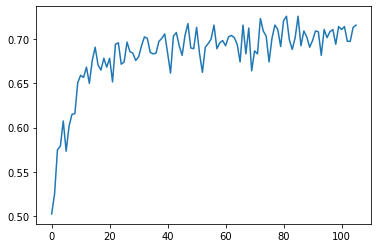

In [212]:
plt.plot(acc)

In [ ]:
curr_acc = test(dataloader['test'])

In [358]:
torch.save(model, "low_comp_polo_stn_dual.pt")

In [361]:
data, label = next(iter(dataloader['test']))

In [194]:
output = model.stn(data[0], data[1])

tensor([-0.5679, -0.1236], grad_fn=<SelectBackward0>)


In [219]:
num=1
with torch.no_grad():
    cat, theta, z, _, _ = model(data[0], data[1])
cat = torch.argmax(F.softmax(cat),1)

tensor([-0.4786, -0.2732])


In [220]:
output[0].shape

torch.Size([50, 3, 256, 256])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


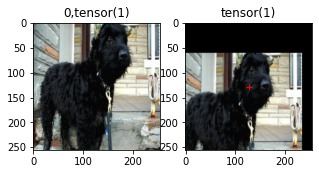

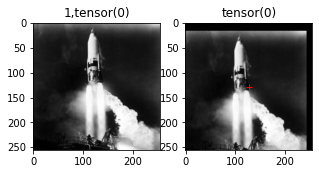

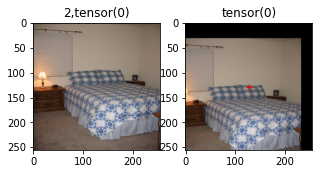

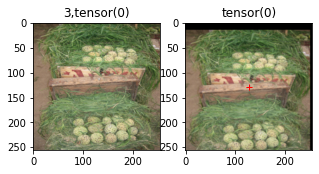

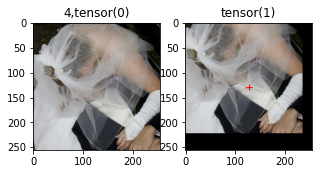

...

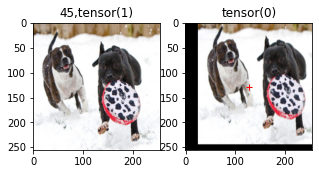

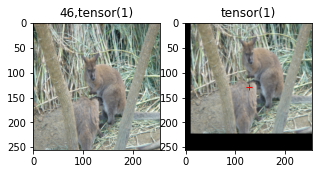

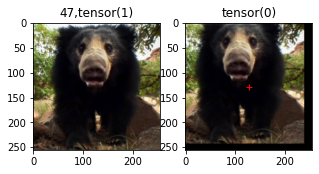

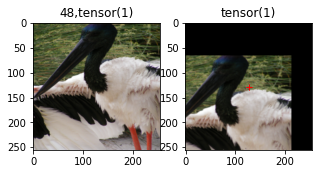

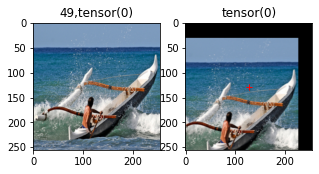

In [229]:
#theta = torch.cat((model.downscale.unsqueeze(0).repeat(
#            theta.size(0), 1, 1), theta.unsqueeze(2)),
#                          dim=2)
        
        #theta = theta.view(-1, 2, 3)
for num in range(50):
    plt.figure(figsize=(5,10))
    plt.subplot(1,2,1)
    img = data[0][num:num+1,...]   
    th = theta[num:num+1,...]
    #theta[0,:,2] = torch.FloatTensor((0,.5))
    #print(th)
    grid_size = torch.Size([1, 3, 256, 256])
    grid = F.affine_grid(th, grid_size)
    img_grid = F.grid_sample(img, grid)
    plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
    plt.title(str(num)+', '+str(label[num]))
    plt.subplot(1,2,2)
    plt.imshow(img_grid[0,:].permute(1,2,0).detach().numpy())
    plt.plot(128,128,'r+')
    plt.title(cat[num])

tensor([-0.0827,  0.1481])
tensor([-0.2718, -0.1649])
tensor([ 0.1190, -0.0087])
tensor([-0.0047, -0.0361])
tensor([-0.0089, -0.0988])
tensor([0.0234, 0.0879])
tensor([0.0781, 0.0181])
tensor([ 0.2226, -0.0653])
tensor([-0.1998, -0.3330])
tensor([-0.0704, -0.1390])
tensor([0.0260, 0.2395])
tensor([-0.2667, -0.0790])
tensor([-0.1854, -0.1457])
tensor([ 0.2255, -0.3490])
tensor([-0.1059,  0.4010])
tensor([0.0696, 0.0390])
tensor([ 0.5338, -0.3150])
tensor([-0.1990,  0.2773])
tensor([ 0.1493, -0.1635])
tensor([ 0.0763, -0.2631])
tensor([0.0340, 0.2128])


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


tensor([ 0.4800, -0.0665])
tensor([-0.2778, -0.5928])
tensor([0.5476, 0.2327])
tensor([-0.0528,  0.1617])
tensor([-0.3168,  0.2843])
tensor([0.2325, 0.5368])
tensor([-0.0597,  0.3627])
tensor([-0.1111, -0.0930])
tensor([0.0195, 0.0728])
tensor([ 0.5736, -0.0192])
tensor([0.0621, 0.6593])
tensor([0.1199, 0.3009])
tensor([-0.1187, -0.4420])
tensor([0.1406, 0.4524])
tensor([-0.2413, -0.6017])
tensor([-0.3741,  0.2353])
tensor([0.6423, 0.0468])
tensor([-0.0042, -0.1891])
tensor([ 0.2323, -0.0134])
tensor([ 0.2562, -0.0254])
tensor([-0.0829,  0.2589])
tensor([-0.5742, -0.2785])
tensor([0.4341, 0.3459])
tensor([-0.2313, -0.0928])
tensor([ 0.0239, -0.5487])
tensor([-0.0460,  0.2830])
tensor([ 0.0309, -0.4374])
tensor([-0.3962, -0.4556])
tensor([-0.1871,  0.0294])


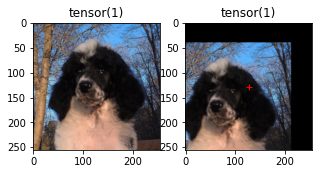

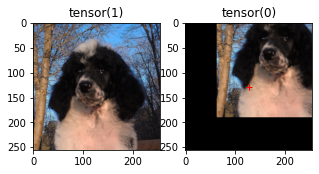

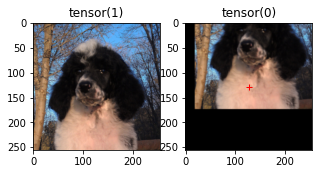

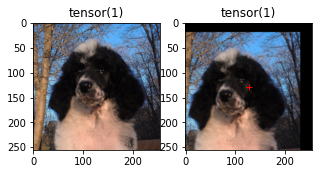

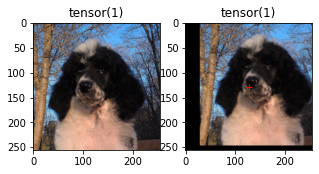

...

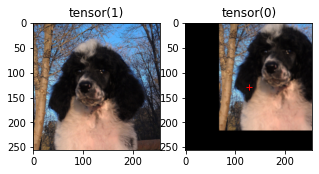

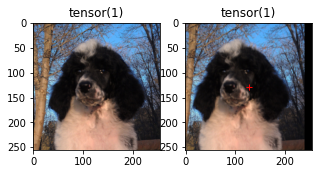

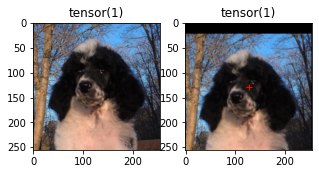

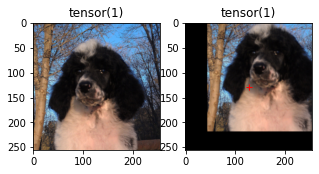

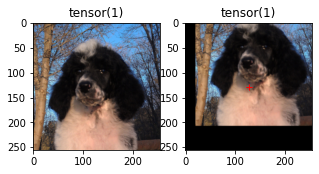

In [362]:
#theta = torch.cat((model.downscale.unsqueeze(0).repeat(
#            theta.size(0), 1, 1), theta.unsqueeze(2)),
#                          dim=2)
mem_z  = []
mem_cat  = []

        #theta = theta.view(-1, 2, 3)
for num in [43,]*50: #range(50):
    with torch.no_grad():
        #img = data[0][num,...].unsqueeze(0)
        #polo_img = {'in': data[1]['in'][num,...].unsqueeze(0),
        #             'out': data[1]['out'][num,...].unsqueeze(0)}
        cat, theta, z, _, _ = model(data[0], data[1])
    cat = torch.argmax(F.softmax(cat),1)
    plt.figure(figsize=(5,10))
    plt.subplot(1,2,1)
    img = data[0][num:num+1,...]   
    th = theta[num:num+1,...]
    mem_z.append(z)
    mem_cat.append(cat)
    #theta[0,:,2] = torch.FloatTensor((0,.5))
    #print(th)
    grid_size = torch.Size([1, 3, 256, 256])
    grid = F.affine_grid(th, grid_size)
    img_grid = F.grid_sample(img, grid)
    plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
    plt.title(label[num])
    plt.subplot(1,2,2)
    plt.imshow(img_grid[0,:].permute(1,2,0).detach().numpy())
    plt.plot(128,128,'r+')
    plt.title(cat[num])


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


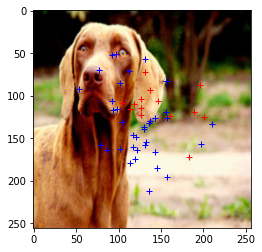

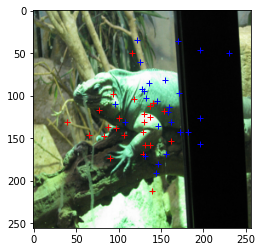

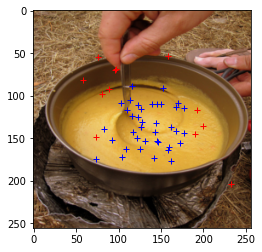

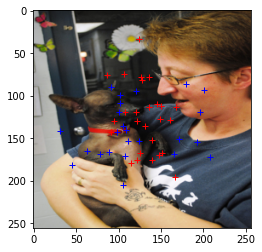

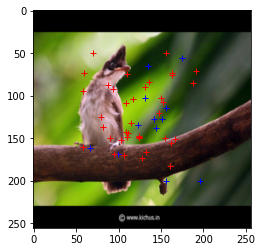

...

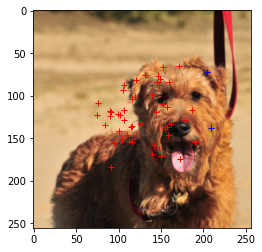

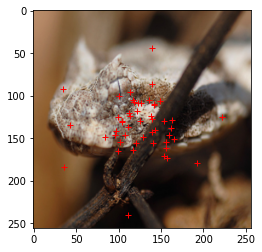

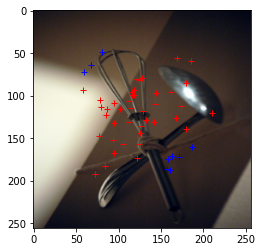

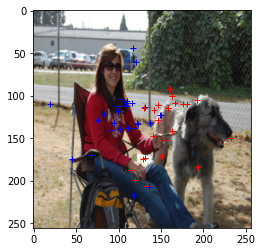

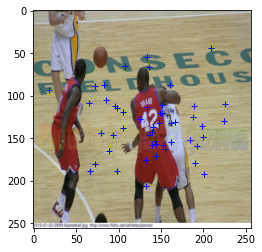

In [365]:
for num in range(batch_size):
    plt.figure()
    plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
    for i, z in enumerate(mem_z):
        if mem_cat[i][num] == 1:
            plt.plot(127.5 + z[num][0]*128, 127.5 + z[num][1]*128,'r+')
        else:
            plt.plot(127.5 + z[num][0]*128, 127.5 + z[num][1]*128,'b+')

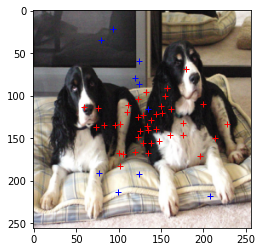

In [309]:
plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
for i, z in enumerate(mem_z):
    if mem_cat[i] == 1:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'r+')
    else:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'b+')

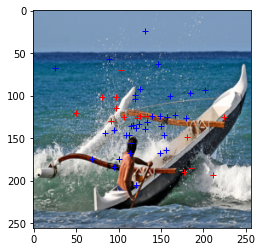

In [311]:
plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
for i, z in enumerate(mem_z):
    if mem_cat[i] == 1:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'r+')
    else:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'b+')

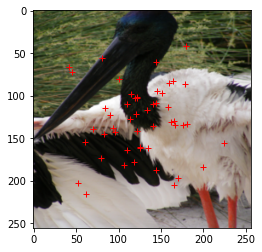

In [313]:
plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
for i, z in enumerate(mem_z):
    if mem_cat[i] == 1:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'r+')
    else:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'b+')

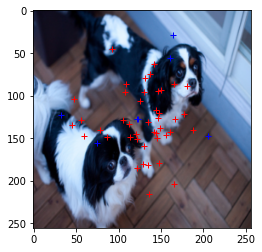

In [315]:
plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
for i, z in enumerate(mem_z):
    if mem_cat[i] == 1:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'r+')
    else:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'b+')

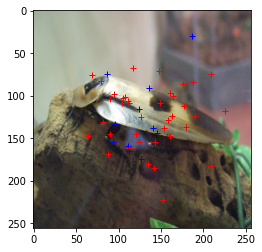

In [317]:
plt.imshow(data[0][num,...].permute(1,2,0).detach().numpy())
for i, z in enumerate(mem_z):
    if mem_cat[i] == 1:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'r+')
    else:
        plt.plot(127.5 + z[0]*128, 127.5 + z[1]*128,'b+')

In [308]:
cat[48]

tensor(1)

In [285]:
mem_z[18:19]

[tensor([-0.0250,  0.4081])]

In [269]:
len(mem_z)

20

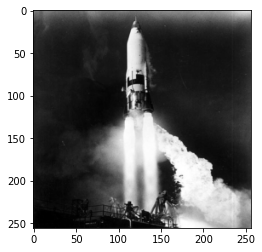

In [192]:
plt.imshow(data[0][1,:].permute(1,2,0).detach().numpy())

In [ ]:
plt.imshow(output[0][1,:].permute(1,2,0).detach().numpy())

In [ ]:
output[1][1][:,2].detach().numpy()

# Training on lesser contrasts

In [ ]:
#optimizer = optim.SGD(model.parameters(), lr=lr) #
#loss_func = nn.CrossEntropyLoss()
#scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5, last_epoch=-1)

In [ ]:
for contrast in (0.5, 0.3):

    print("training on contrast %s" %(contrast))

    args.offset_std = 40 #train while the maximum range is 40
    args.contrast = contrast
    transform_big = transforms.Compose([
        RetinaFill(N_pic=args.N_pic),
        WhereShift(args),
        RetinaBackground(contrast=args.contrast,
                         noise=args.noise,
                         sf_0=args.sf_0,
                         B_sf=args.B_sf, flexible=True),
        RetinaMask(N_pic=args.N_pic),
        transforms.ToTensor(),
        DualCroppedPyramid(width, 
                       base_levels, 
                       n_levels=n_levels),
        DualLogGaborTransform(color=color),
        #LogGaborReshape(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color)
    ])


    train_loader = torch.utils.data.DataLoader(MNIST(
        '../data',
        train=True,
        download=True,
        transform=transform_big,
    ),
                                               batch_size=args.minibatch_size,
                                               shuffle=True)

    test_loader = torch.utils.data.DataLoader(MNIST(
        '../data',
        train=False,
        download=True,
        transform=transform_big,
    ),
                                              batch_size=args.minibatch_size,
                                              shuffle=True)

    print("Training on eccentricity=%s" % (args.offset_std))
    args.epochs = 40

    for epoch in range(1, args.epochs + 1):
        train(epoch, train_loader)
        curr_acc = test(test_loader)
        #acc.append(curr_acc)
        scheduler.step()
    torch.save(model, f"low_comp_polo_stn_{contrast}.pt")

## Retraining with a fresh scheduler

In [ ]:
optimizer = optim.SGD(model.parameters(), lr=lr) #
loss_func = nn.CrossEntropyLoss()
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5, last_epoch=-1)

In [ ]:
for contrast in (0.3,):

    print("training on contrast %s" %(contrast))

    args.offset_std = 40 #train while the maximum range is 40
    args.contrast = contrast
    transform_big = transforms.Compose([
        RetinaFill(N_pic=args.N_pic),
        WhereShift(args),
        RetinaBackground(contrast=args.contrast,
                         noise=args.noise,
                         sf_0=args.sf_0,
                         B_sf=args.B_sf, flexible=True),
        RetinaMask(N_pic=args.N_pic),
        transforms.ToTensor(),
        DualCroppedPyramid(width, 
                       base_levels, 
                       n_levels=n_levels),
        DualLogGaborTransform(color=color),
        #LogGaborReshape(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color)
    ])


    train_loader = torch.utils.data.DataLoader(MNIST(
        '../data',
        train=True,
        download=True,
        transform=transform_big,
    ),
                                               batch_size=args.minibatch_size,
                                               shuffle=True)

    test_loader = torch.utils.data.DataLoader(MNIST(
        '../data',
        train=False,
        download=True,
        transform=transform_big,
    ),
                                              batch_size=args.minibatch_size,
                                              shuffle=True)

    print("Training on eccentricity=%s" % (args.offset_std))
    args.epochs = 50

    for epoch in range(1, args.epochs + 1):
        train(epoch, train_loader)
        curr_acc = test(test_loader)
        #acc.append(curr_acc)
        scheduler.step()
    torch.save(model, f"low_comp_polo_stn_{contrast}_retrain.pt")

In [ ]:
for contrast in (0.3,):

    print("training on contrast %s" %(contrast))

    args.offset_std = 40 #train while the maximum range is 40
    args.contrast = contrast
    transform_big = transforms.Compose([
        RetinaFill(N_pic=args.N_pic),
        WhereShift(args),
        RetinaBackground(contrast=args.contrast,
                         noise=args.noise,
                         sf_0=args.sf_0,
                         B_sf=args.B_sf, flexible=True),
        RetinaMask(N_pic=args.N_pic),
        transforms.ToTensor(),
        DualCroppedPyramid(width, 
                       base_levels, 
                       n_levels=n_levels),
        DualLogGaborTransform(color=color),
        #LogGaborReshape(n_levels, n_color, n_eccentricity, n_azimuth, n_theta, n_phase, color=color)
    ])


    train_loader = torch.utils.data.DataLoader(MNIST(
        '../data',
        train=True,
        download=True,
        transform=transform_big,
    ),
                                               batch_size=args.minibatch_size,
                                               shuffle=True)

    test_loader = torch.utils.data.DataLoader(MNIST(
        '../data',
        train=False,
        download=True,
        transform=transform_big,
    ),
                                              batch_size=args.minibatch_size,
                                              shuffle=True)

    print("Training on eccentricity=%s" % (args.offset_std))
    args.epochs = 50

    for epoch in range(1, args.epochs + 1):
        train(epoch, train_loader)
        curr_acc = test(test_loader)
        #acc.append(curr_acc)
        scheduler.step()
    torch.save(model, f"low_comp_polo_stn_{contrast}_retrain_continued.pt")

# Saving the model

# Visualizing some transformations

In [ ]:
def convert_image_np(inp):
    """Convert a Tensor to numpy image."""
    inp = inp.numpy().transpose((1, 2, 0))
    #mean = np.array([0.485, 0.456, 0.406])
    #std = np.array([0.229, 0.224, 0.225])
    #inp = std * inp + mean
    #inp = np.clip(inp, 0, 1)
    return inp

thetas = []
def visualize_stn():
    with torch.no_grad():
        # Get a batch of training data
        
        data, label = next(iter(test_loader))
        data_original = data[0][:16, ...].to(device)
        data_polo = {'in': data[1]['in'][:16, ...].to(device),
                     'out': data[1]['out'][:16, ...].to(device)}
        
        input_tensor = data_original.cpu()
        
        output_tensor, theta = model.stn(data_original, data_polo)
        thetas.append(theta)
        
        #output_tensor = F.pad(input=output_tensor, pad=(50, 50, 50, 50), mode='constant', value=0)

        transformed_input_tensor = output_tensor.cpu()

        in_grid = convert_image_np(
            torchvision.utils.make_grid(input_tensor, nrow=4))

        out_grid = convert_image_np(
            torchvision.utils.make_grid(transformed_input_tensor, nrow=4))

        # Plot the results side-by-side
        f, axarr = plt.subplots(1, 2, dpi=300)
        axarr[0].imshow(in_grid)
        axarr[0].set_title('Dataset Images')
        axarr[0].set_xticks([0, 131])
        axarr[0].set_yticks([390])
        axarr[0].set_yticklabels([128])
        axarr[0].set_xticklabels([0, 128])

        axarr[1].imshow(out_grid)
        axarr[1].set_title('Transformed Images')
        axarr[1].set_xticks([0, 30])
        axarr[1].set_yticks([90])
        axarr[1].set_yticklabels([28])
        axarr[1].set_xticklabels([0, 28])

        #f.savefig('../figures/polo_atn_attention.png')

In [ ]:
visualize_stn()

In [ ]:
visualize_stn()

In [ ]:
visualize_stn()

In [ ]:
visualize_stn()

# Performance of the Polo-ATN

In [ ]:
def test(loader):
    with torch.no_grad():
        model.eval()
        test_loss = 0
        correct = 0
        for data, target in loader:
            data_original, data_polo = data[0], data[1]
            data_original = data_original.to(device, dtype=torch.double)            
            data_polo['in'] = data_polo['in'].to(device, dtype=torch.double) 
            data_polo['out'] = data_polo['out'].to(device, dtype=torch.double) 
            target = target.to(device)

            output = model(data_original, data_polo)

            # sum up batch loss
            #test_loss += F.nll_loss(output, target, size_average=False).item()
            test_loss += loss_func(output, target).item()
            # get the index of the max log-probability
            #pred = output.max(1, keepdim=True)[1]
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

        test_loss /= len(test_loader.dataset)
        print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.
              format(test_loss, correct, len(test_loader.dataset),
                     100. * correct / len(test_loader.dataset)))
        return correct / len(test_loader.dataset)

In [ ]:
polo_atn_stats = {}

for contrast in contrasts:
    print("Testing on contrast = %s" % (contrast))

    accuracies = []

    for ecc in eccentricities:
        

        transform_big = transforms.Compose([
            RetinaFill(N_pic=args.N_pic),
            WhereShift(args, radius=ecc),  # given eccentricity
            RetinaBackground(
                contrast=contrast,  # given contrast
                noise=args.noise,
                sf_0=args.sf_0,
                B_sf=args.B_sf,
                flexible=False),  # a fixed contrast
            RetinaMask(N_pic=args.N_pic),
            transforms.ToTensor(),
            DualCroppedPyramid(width, base_levels, n_levels=n_levels),
            DualLogGaborTransform(color=color),
            #DualLogGaborReshape(n_levels,
            #                n_color,
            #                n_eccentricity,
            #                n_azimuth,
            #                n_theta,
            #                n_phase,
            #                color=color)
        ])
        train_loader = torch.utils.data.DataLoader(
            MNIST(
                '../data',
                train=True,
                download=True,
                transform=transform_big,
            ),
            batch_size=args.minibatch_size,
            shuffle=True)

        test_loader = torch.utils.data.DataLoader(
            MNIST(
                '../data',
                train=False,
                download=True,
                transform=transform_big,
            ),
            batch_size=args.minibatch_size,
            shuffle=True)
        print("Testing on eccentricity = %s" % (ecc))
        acc = test(test_loader)
        accuracies.append(acc)

    polo_atn_stats[contrast] = np.array(accuracies)

In [ ]:
polo_atn_stats = {}

for contrast in contrasts:
    print("Testing on contrast = %s" % (contrast))

    accuracies = []

    for ecc in eccentricities:
        

        transform_big = transforms.Compose([
            RetinaFill(N_pic=args.N_pic),
            WhereShift(args, radius=ecc),  # given eccentricity
            RetinaBackground(
                contrast=contrast,  # given contrast
                noise=args.noise,
                sf_0=args.sf_0,
                B_sf=args.B_sf,
                flexible=False),  # a fixed contrast
            RetinaMask(N_pic=args.N_pic),
            transforms.ToTensor(),
            DualCroppedPyramid(width, base_levels, n_levels=n_levels),
            DualLogGaborTransform(color=color),
            #DualLogGaborReshape(n_levels,
            #                n_color,
            #                n_eccentricity,
            #                n_azimuth,
            #                n_theta,
            #                n_phase,
            #                color=color)
        ])
        train_loader = torch.utils.data.DataLoader(
            MNIST(
                '../data',
                train=True,
                download=True,
                transform=transform_big,
            ),
            batch_size=args.minibatch_size,
            shuffle=True)

        test_loader = torch.utils.data.DataLoader(
            MNIST(
                '../data',
                train=False,
                download=True,
                transform=transform_big,
            ),
            batch_size=args.minibatch_size,
            shuffle=True)
        print("Testing on eccentricity = %s" % (ecc))
        acc = test(test_loader)
        accuracies.append(acc)

    polo_atn_stats[contrast] = np.array(accuracies)

In [ ]:
polo_atn_stats = {}

for contrast in contrasts:
    print("Testing on contrast = %s" % (contrast))

    accuracies = []

    for ecc in eccentricities:
        

        transform_big = transforms.Compose([
            RetinaFill(N_pic=args.N_pic),
            WhereShift(args, radius=ecc),  # given eccentricity
            RetinaBackground(
                contrast=contrast,  # given contrast
                noise=args.noise,
                sf_0=args.sf_0,
                B_sf=args.B_sf,
                flexible=False),  # a fixed contrast
            RetinaMask(N_pic=args.N_pic),
            transforms.ToTensor(),
            DualCroppedPyramid(width, base_levels, n_levels=n_levels),
            DualLogGaborTransform(color=color),
            #DualLogGaborReshape(n_levels,
            #                n_color,
            #                n_eccentricity,
            #                n_azimuth,
            #                n_theta,
            #                n_phase,
            #                color=color)
        ])
        train_loader = torch.utils.data.DataLoader(
            MNIST(
                '../data',
                train=True,
                download=True,
                transform=transform_big,
            ),
            batch_size=args.minibatch_size,
            shuffle=True)

        test_loader = torch.utils.data.DataLoader(
            MNIST(
                '../data',
                train=False,
                download=True,
                transform=transform_big,
            ),
            batch_size=args.minibatch_size,
            shuffle=True)
        print("Testing on eccentricity = %s" % (ecc))
        acc = test(test_loader)
        accuracies.append(acc)

    polo_atn_stats[contrast] = np.array(accuracies)

In [ ]:
polo_atn_stats = {}

for contrast in contrasts:
    print("Testing on contrast = %s" % (contrast))

    accuracies = []

    for ecc in eccentricities:
        

        transform_big = transforms.Compose([
            RetinaFill(N_pic=args.N_pic),
            WhereShift(args, radius=ecc),  # given eccentricity
            RetinaBackground(
                contrast=contrast,  # given contrast
                noise=args.noise,
                sf_0=args.sf_0,
                B_sf=args.B_sf,
                flexible=False),  # a fixed contrast
            RetinaMask(N_pic=args.N_pic),
            transforms.ToTensor(),
            DualCroppedPyramid(width, base_levels, n_levels=n_levels),
            DualLogGaborTransform(color=color),
            #DualLogGaborReshape(n_levels,
            #                n_color,
            #                n_eccentricity,
            #                n_azimuth,
            #                n_theta,
            #                n_phase,
            #                color=color)
        ])
        train_loader = torch.utils.data.DataLoader(
            MNIST(
                '../data',
                train=True,
                download=True,
                transform=transform_big,
            ),
            batch_size=args.minibatch_size,
            shuffle=True)

        test_loader = torch.utils.data.DataLoader(
            MNIST(
                '../data',
                train=False,
                download=True,
                transform=transform_big,
            ),
            batch_size=args.minibatch_size,
            shuffle=True)
        print("Testing on eccentricity = %s" % (ecc))
        acc = test(test_loader)
        accuracies.append(acc)

    polo_atn_stats[contrast] = np.array(accuracies)

In [ ]:
polo_atn_stats

In [ ]:
polo_atn_stats

In [ ]:
polo_atn_stats

In [ ]:
### ref
accuracy_data= [0.62, 0.69, 0.726, 0.714, 0.799, 0.81, 0.846, 0.889, 0.89 ] 
accuracy_data = accuracy_data[::-1]



In [ ]:
plt.plot(polo_atn_stats[0.7])
plt.plot(polo_atn_stats[0.5])
plt.plot(polo_atn_stats[0.3])
plt.plot(accuracy_data)


In [ ]:
plt.plot(polo_atn_stats[0.7])
plt.plot(polo_atn_stats[0.5])
plt.plot(polo_atn_stats[0.3])
plt.plot(accuracy_data)


In [ ]:
plt.plot(polo_atn_stats[0.7])
plt.plot(polo_atn_stats[0.5])
plt.plot(polo_atn_stats[0.3])
plt.plot(accuracy_data)


In [ ]:
### Contrast 0.7 only

In [ ]:
### Training on 0.7, 0.5 and 0.3

In [ ]:
### 50 epochs retraining on 0.3

In [ ]:
### 100 epochs retraining on 0.3